# AIRBNB BOSTON
- Data source: http://insideairbnb.com/explore
- The Septembre 2022 Boston Airbnb dataset is composed of three files respectively:
    - Listings, including full descriptions and average review score
    - Reviews, including unique id for each reviewer and detailed comments
    - Calendar, including listing id and the price and availability for that day
    
- The analysis aims at answering the following 6 questions:
    1. Price seasonality during the year - By how much do prices spike?
    2. What are the busiest times of the year to visit Boston?
    3. Is there a general upward trend of both new Airbnb listings and total Airbnb visitors to Boston?
    4. Can you describe the vibe of each Boston neighborhood using listing descriptions?
    5. Can you predict the rental price of a new property based on available features ?
    6. Can the property text description from the host improve the prediction ?

# 1- Import libraries

In [227]:
# useful standard librairies
import pandas as pd
import numpy as np
import os
import re
import json
import ast
from tqdm import tqdm
tqdm.pandas()
from datetime import datetime, timedelta
from pprint import pprint 

# Librairies for modelisation
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer

# Libraries for visualization
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
from wordcloud import WordCloud
import seaborn as sns

# for nlp tasks
import html, re, string
punct = set(string.punctuation)
import nltk
from nltk.corpus import stopwords
nltk.download("stopwords")
import spacy
# !python -m spacy download en_core_web_sm
nlp = spacy.load("en_core_web_sm")
spacy.prefer_gpu()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lveys\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


False

In [2]:
import winsound

def make_noise():
    """helper function used to indicate the end of long calculations"""
    duration = 1000  # milliseconds
    freq = 440  # Hz
    winsound.Beep(freq, duration)

# 2 - Load the data

In [16]:
def clean_column(item):
    "piecewise cleaning of dataframe"
    item = item.replace('$','')
    item = item.replace(',','')
    return float(item)

def load_dataset(filename):
    """helper function to load a dataset and return dataframe"""
    # path to the file to read
    filepath = os.path.join('Datasets',city,filename+'.csv')
    df = pd.read_csv(filepath)
    
    if filename in ['calendar']:
        df['price'] = df['price'].apply(clean_column)
        df['adjusted_price'] = df['adjusted_price'].apply(clean_column)
        df['date'] = pd.to_datetime(df['date'])
        
    if filename == 'listings':
        df['price'] = df['price'].apply(clean_column)
        df['host_since'] = pd.to_datetime(df['host_since'])
        df['first_review'] = pd.to_datetime(df['first_review'])
        df['last_review'] = pd.to_datetime(df['last_review'])
        
    if filename == 'reviews':
        df['date'] = pd.to_datetime(df['date'])
    
    print(f"the file is composed of {df.shape[0]} rows and {df.shape[1]} columns")
    print()
    print('******** Dataset summary statistics ********')
    print(df.info())
    print()
    display(df.describe().apply(lambda s: s.apply('{0:.2f}'.format)))
    print()
    display(df.head(3))
    return df

### Calendar

In [52]:
filenames = ['calendar','listings','reviews']
city = 'Boston'

calendar = load_dataset(filenames[0])

the file is composed of 1891795 rows and 7 columns

******** Dataset summary statistics ********
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1891795 entries, 0 to 1891794
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      int64         
 1   date            datetime64[ns]
 2   available       object        
 3   price           float64       
 4   adjusted_price  float64       
 5   minimum_nights  int64         
 6   maximum_nights  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(1)
memory usage: 101.0+ MB
None



,listing_id,price,adjusted_price,minimum_nights,maximum_nights
count,1891795.00,1891795.00,1891795.00,1891795.00,1891795.00
mean,144052436451162096.00,248.98,248.53,89.99,4245216.58
std,267410946814870880.00,436.23,435.73,203.26,95376394.25
min,3168.00,0.00,0.00,1.00,1.00
25%,20815139.00,100.00,100.00,2.00,365.00
50%,43216937.00,179.00,179.00,14.00,1125.00
75%,53589268.00,275.00,275.00,75.00,1125.00
max,716240339038945920.00,11683.00,11683.00,998.00,2147483647.00


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,3781,2022-09-15,f,125.0,125.0,32,1125
1,3781,2022-09-16,f,150.0,150.0,32,1125
2,3781,2022-09-17,f,150.0,150.0,32,1125


### Listings
- full description of the dataset is available [here](https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit?usp=sharing)

In [267]:
listings = load_dataset(filenames[1])

the file is composed of 5185 rows and 75 columns

******** Dataset summary statistics ********
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5185 entries, 0 to 5184
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            5185 non-null   int64         
 1   listing_url                                   5185 non-null   object        
 2   scrape_id                                     5185 non-null   int64         
 3   last_scraped                                  5185 non-null   object        
 4   source                                        5185 non-null   object        
 5   name                                          5185 non-null   object        
 6   description                                   5140 non-null   object        
 7   neighborhood_overview                         3435 non-

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,5185.00,5185.00,5185.00,5185.00,5185.00,0.00,5185.00,5185.00,5185.00,0.00,...,3950.00,3948.00,3950.00,3948.00,3948.00,5185.00,5185.00,5185.00,5185.00,3960.00
mean,143996871384081344.00,20220915162158.00,125494858.16,409.08,476.31,nan,42.35,-71.09,3.24,nan,...,4.71,4.84,4.81,4.78,4.61,62.29,55.14,7.10,0.02,1.81
std,267400047351551776.00,0.00,130088987.92,1173.97,1260.37,nan,0.03,0.04,2.20,nan,...,0.43,0.35,0.40,0.34,0.44,135.19,135.82,21.17,0.28,2.00
min,3168.00,20220915162158.00,3697.00,1.00,1.00,nan,42.23,-71.20,0.00,nan,...,0.00,0.00,1.00,1.00,1.00,1.00,0.00,0.00,0.00,0.01
25%,20829873.00,20220915162158.00,18517776.00,2.00,3.00,nan,42.33,-71.11,2.00,nan,...,4.63,4.83,4.80,4.71,4.50,2.00,1.00,0.00,0.00,0.31
50%,43216937.00,20220915162158.00,87330733.00,8.00,12.00,nan,42.35,-71.08,2.00,nan,...,4.85,4.94,4.93,4.89,4.72,6.00,2.00,0.00,0.00,1.06
75%,53582163.00,20220915162158.00,212359760.00,58.00,105.00,nan,42.37,-71.06,4.00,nan,...,4.98,5.00,5.00,5.00,4.86,45.00,25.00,3.00,0.00,2.66
max,716240339038945920.00,20220915162158.00,479130189.00,4084.00,4384.00,nan,42.41,-70.91,16.00,nan,...,5.00,5.00,5.00,5.00,5.00,477.00,477.00,112.00,7.00,18.11


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3168,https://www.airbnb.com/rooms/3168,20220915162158,2022-09-15,city scrape,TudorStudio,"The ""Studio at 14 Weldon"" is located in Newton...","Newton has 13 unique villages, and gives off a...",https://a0.muscache.com/pictures/ff7952dc-ef0b...,3697,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
1,3781,https://www.airbnb.com/rooms/3781,20220915162158,2022-09-15,city scrape,HARBORSIDE-Walk to subway,Fully separate apartment in a two apartment bu...,"Mostly quiet ( no loud music, no crowed sidewa...",https://a0.muscache.com/pictures/24670/b2de044...,4804,...,4.96,4.87,4.91,NaN,f,1,1,0,0,0.26
2,5506,https://www.airbnb.com/rooms/5506,20220915162158,2022-09-15,city scrape,** Fort Hill Inn Private! Minutes to center!**,"Private guest room with private bath, You do n...","Peaceful, Architecturally interesting, histori...",https://a0.muscache.com/pictures/miso/Hosting-...,8229,...,4.89,4.54,4.73,Approved by the government,f,10,10,0,0,0.69


- The listings dataset has numerous columns which we do not intend to use for various reasons
    - bathrooms is empty
    - listing url, picture url etc... will not be used in modeling
    - detailed and calculated information about the host
    - redundant neiborhood informations
    - ...
- we will retain only the following columns to start with, each section addressing as specific value component of the rental property:

In [268]:
keep_columns = ['id','host_since',   # HOST RELATED
                'name','description','property_type', 'room_type', # PROPERTY DESCRIPTION
                'neighborhood_overview','neighbourhood_cleansed', 'latitude','longitude', # PROPERTY LOCALIZATION
                'accommodates','bathrooms_text','bedrooms','beds', # PROPERTY CAPACITY
                'amenities', # PROPERTY OFFERING
                'number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d', 'reviews_per_month', 'review_scores_rating',   # POPULARITY
                'minimum_nights','maximum_nights',  # MISC
                'price',
               ]

dropped_columns = [c for c in listings.columns if c not in keep_columns]
print(f'We will not consider these {len(dropped_columns)} columns in this first approach:')
pprint(dropped_columns)
listings_short = listings[keep_columns].copy()

We will not consider these 52 columns in this first approach:
['listing_url',
 'scrape_id',
 'last_scraped',
 'source',
 'picture_url',
 'host_id',
 'host_url',
 'host_name',
 'host_location',
 'host_about',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_thumbnail_url',
 'host_picture_url',
 'host_neighbourhood',
 'host_listings_count',
 'host_total_listings_count',
 'host_verifications',
 'host_has_profile_pic',
 'host_identity_verified',
 'neighbourhood',
 'neighbourhood_group_cleansed',
 'bathrooms',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm',
 'calendar_updated',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'calendar_last_scraped',
 'first_review',
 'last_review',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_sc

### Reviews

In [212]:
reviews = load_dataset(filenames[2])

the file is composed of 245317 rows and 6 columns

******** Dataset summary statistics ********
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245317 entries, 0 to 245316
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   listing_id     245317 non-null  int64         
 1   id             245317 non-null  int64         
 2   date           245317 non-null  datetime64[ns]
 3   reviewer_id    245317 non-null  int64         
 4   reviewer_name  245316 non-null  object        
 5   comments       245267 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 11.2+ MB
None



,listing_id,id,reviewer_id
count,245317.00,245317.00,245317.00
mean,11988470456701930.00,190083833698306816.00,127870205.59
std,84099269878106880.00,274140949905662400.00,121953021.26
min,3781.00,1021.00,3.00
25%,7330494.00,264318911.00,29777749.00
50%,18290558.00,538986444.00,86588682.00
75%,33072838.00,477508809581710336.00,191602237.00
max,710837891981177856.00,724635736679380352.00,479132724.00


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,3781,37776825,2015-07-10,36059247,Greg,The apartment was as advertised and Frank was ...
1,3781,41842494,2015-08-09,10459388,Tai,It was a pleasure to stay at Frank's place. Th...
2,3781,45282151,2015-09-01,12264652,Damien,The apartment description is entirely faithful...


# 3- Preliminary Data exploration

### Calendar: Analyze column date and adjusted_price



- The period covered is slightly higher than a year

In [53]:
print("Number of dates in the calendar dataset:",len(calendar.groupby('date')))
print("minimum date:", min(calendar.date))
print("maximum date:", max(calendar.date))

Number of dates in the calendar dataset: 382
minimum date: 2022-09-15 00:00:00
maximum date: 2023-10-01 00:00:00


- prices beyond a year are set to 140 by default and should be excluded

In [54]:
bool_series = calendar["date"] > '2023-09-14'
calendar[bool_series]

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
1065418,3510127,2023-09-15,t,140.0,140.0,1,1125
1065419,3510127,2023-09-16,t,140.0,140.0,1,1125
1065420,3510127,2023-09-17,t,140.0,140.0,1,1125
1065421,3510127,2023-09-18,t,140.0,140.0,1,1125
1065422,3510127,2023-09-19,t,140.0,140.0,1,1125
1065423,3510127,2023-09-20,t,140.0,140.0,1,1125
1065424,3510127,2023-09-21,t,140.0,140.0,1,1125
1065425,3510127,2023-09-22,t,140.0,140.0,1,1125
1065426,3510127,2023-09-23,t,140.0,140.0,1,1125
1065427,3510127,2023-09-24,t,140.0,140.0,1,1125


- we will focus on a full year section with appears to be complete

In [55]:
# returning dataframe between above values
bool_series = calendar["date"].between('2022-09-15', '2023-09-14', inclusive = 'both')
len(calendar[bool_series].groupby('date'))

365

- `adjusted_price` column is different from `price`

In [30]:
(calendar['price'] - calendar['adjusted_price']).any() > 0

True

- But delta is minimal =>  we will ignore this column

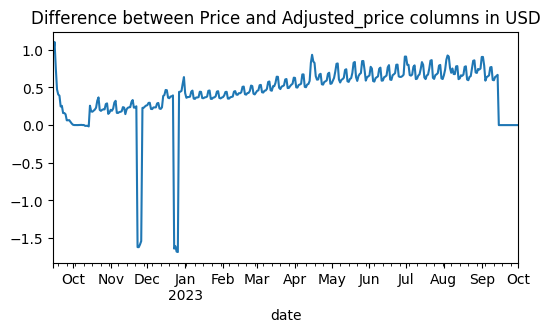

In [38]:
calendar['delta'] = calendar['price'] - calendar['adjusted_price']
calendar.groupby('date')['delta'].mean().plot(y='delta', figsize=(6,3))
plt.title('Difference between Price and Adjusted_price columns in USD')
plt.show()

### Calendar: Analyze minimum_nights and maximum_nights
- Minimum nights for a booking made on this day
- Maximum nights for a booking made on this day
- These data do not seem to bear any information with ceiling values set as standard parameters
- These columns will be discarded

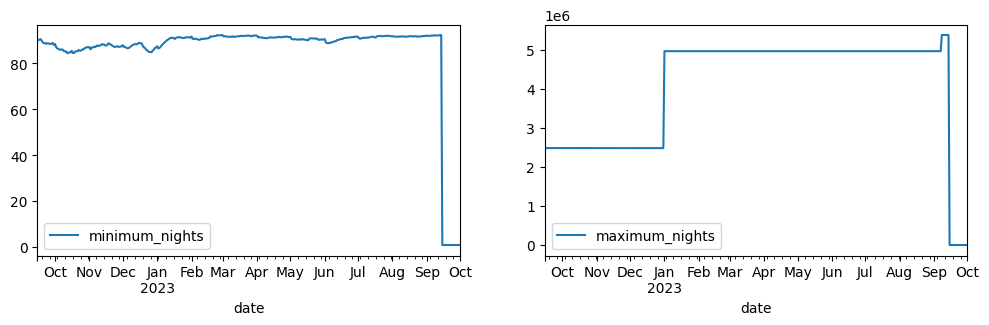

In [46]:
f, ax = plt.subplots(1,2,figsize=(12,3))
calendar.groupby('date')['minimum_nights'].mean().plot(y='minimum_nights', label='minimum_nights', ax=ax[0])
calendar.groupby('date')['maximum_nights'].mean().plot(y='maximum_nights', label='maximum_nights', ax=ax[1])
ax[0].legend(loc='lower left'); ax[1].legend(loc='lower left')
plt.show()

In [40]:
calendar.groupby('date')['maximum_nights'].max()

date
2022-09-15    2147483647
2022-09-16    2147483647
2022-09-17    2147483647
2022-09-18    2147483647
2022-09-19    2147483647
                 ...    
2023-09-27          1125
2023-09-28          1125
2023-09-29          1125
2023-09-30          1125
2023-10-01          1125
Name: maximum_nights, Length: 382, dtype: int64

### Calendar: Analyze availability

- Availability are noted as boolean True or False

In [48]:
calendar.available.unique()

array(['f', 't'], dtype=object)

- we will replace by boolean equivalent

In [56]:
calendar.available = calendar.available.map({'t':True,'f':False})
bool_series = calendar["date"].between('2022-09-15', '2023-09-14', inclusive = 'both')
calendar[bool_series].available.value_counts()

True     985447
False    906331
Name: available, dtype: int64

- the calendar shows reservations going forward starting September 15, 2022
- Average availability is very low short-term with over 90% of the properties booked
- The availability increases as we look ahead but stabilizes at around 50% beyond March 2023
- We see an opposite development between early reservations and price

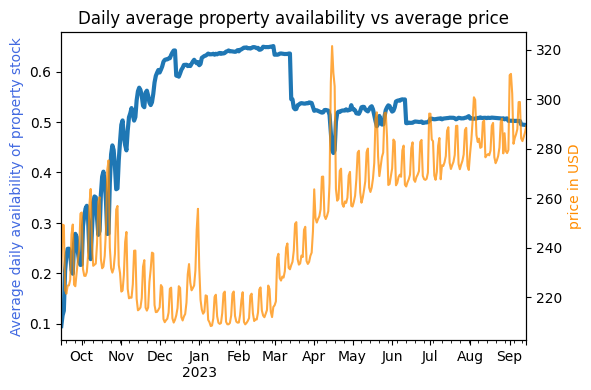

In [89]:
f, ax = plt.subplots(figsize=(6,4))
ax1 = ax.twinx()
calendar[bool_series].groupby('date').available.mean().plot(ax=ax, lw=3, label='availability ratio per day')
calendar[bool_series].groupby('date')['price'].mean().plot(y='price',ax=ax1, c='darkorange', alpha=0.75, label='Average daily price')
ax.set_ylabel('Average daily availability of property stock', color="royalblue")
ax.set_xlabel(None)
ax1.set_ylabel('price in USD', color = 'darkorange')
plt.title('Daily average property availability vs average price')
plt.show()

- Let's answer our first business question

# Q1: Price seasonality during the year - By how much do prices spike?

C:\Users\lveys\AppData\Local\Temp\ipykernel_103936\2020193500.py:2: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  calendar['week'] = pd.DatetimeIndex(calendar['date']).week


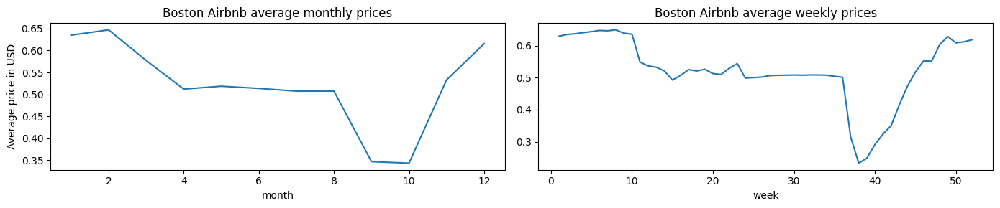

In [117]:
calendar['month'] = pd.DatetimeIndex(calendar['date']).month
calendar['week'] = pd.DatetimeIndex(calendar['date']).week
f, ax = plt.subplots(1,2, figsize=(14,3))
calendar[bool_series].groupby('month')['available'].mean().plot(title='Boston Airbnb average monthly prices', ax=ax[0])
calendar[bool_series].groupby('week')['available'].mean().plot(title='Boston Airbnb average weekly prices', ax=ax[1])
ax[0].set_ylabel("Average price in USD")
plt.tight_layout()
plt.show()

### Q1 Conclusion
- High price seasonality with higher prices during peak vacation periods : Halloween in October,Xmas, Easter, summer season...

In [80]:
# Let's add the day to our dataset
calendar['day'] = calendar.date.apply(lambda x: x.weekday())

- From the price analysis above, we see some kind of daily fluctuation pattern - is this price variation intra-week ?

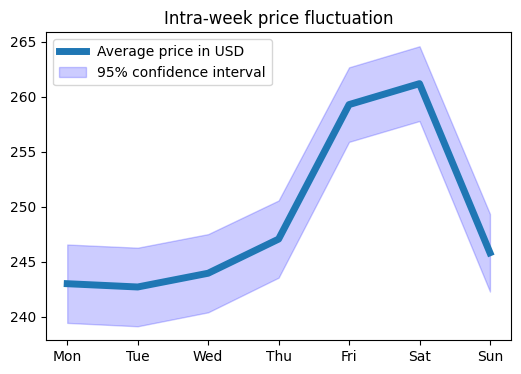

In [90]:
f, ax = plt.subplots(figsize=(6,4))
bool_series = calendar["date"].between('2022-09-15', '2023-09-14', inclusive = 'both')
calendar[bool_series].groupby('day')['price'].mean().plot(y='price', ax=ax, lw=5, label='Average price in USD')

# Define the confidence interval
ci = 2 * calendar[bool_series].groupby('day')['price'].std() / calendar[bool_series].groupby('day')['price'].mean()
plt.fill_between(x=['Mon','Tue','Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
                 y1=(calendar[bool_series].groupby('day')['price'].mean()-ci),
                 y2=(calendar[bool_series].groupby('day')['price'].mean()+ci),
                 color='blue', alpha=0.2, label='95% confidence interval')

# setting x-axis values
labels = ['Mon','Tue','Wed', 'Thu', 'Fri', 'Sat', 'Sun']
plt.xticks(range(7),labels)
plt.xlabel(None)
plt.legend(loc='upper left')
plt.title('Intra-week price fluctuation')
plt.show()

### Conclusion
- Fridays and Saturdays the most expensive
- significant price drop for Sunday nights when reservations are usually ending
- less expensive the first half of the week vs the second half including week-ends when demand is higher

# Q2: What are the busiest times of the year to visit Boston?
- We will use the number of reviews as a proxy for the number of visitors
- we assume the date of the review corresponds to the date of the visit 
- Let's look a a full year excluding COVID lockdowns

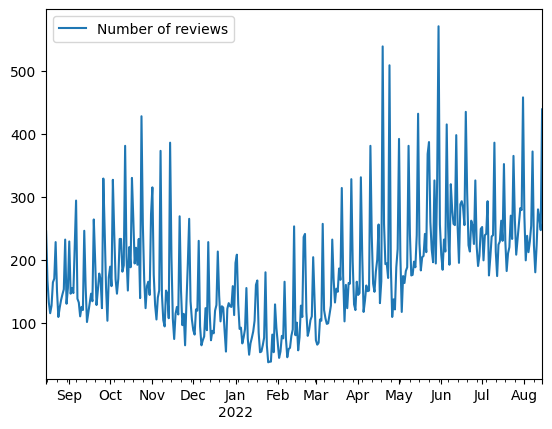

In [126]:
bool_series = reviews["date"].between('2021-8-15', '2022-8-14', inclusive = 'both')
reviews[bool_series].groupby('date').count().plot(y='comments',kind='line', label='Number of reviews')
plt.xlabel(None)
plt.show()

- We can compare to the number of reviews pre-COVID

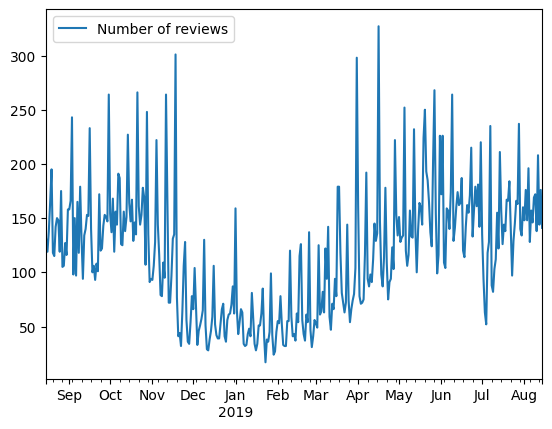

In [125]:
bool_series = reviews["date"].between('2018-8-15', '2019-8-14', inclusive = 'both')
reviews[bool_series].groupby('date').count().plot(y='comments',kind='line', label='Number of reviews')
plt.xlabel(None)
plt.show()

- Both variations over the period look quite similar but the frequency of the comments seem higher in 2021-2022
- Let's check using a t-test
- Our Null hypothesis `H0` will be "The 2 time series come from the same distribution with not statistical difference"

In [128]:
# H0: the 2 series come from same distribution
bool_series = reviews["date"].between('2021-8-15', '2022-8-14', inclusive = 'both')
a = reviews[bool_series].groupby('date').count()['comments']
bool_series = reviews["date"].between('2018-8-15', '2019-8-14', inclusive = 'both')
b = reviews[bool_series].groupby('date').count()['comments']
print('Serie 2021-22: mean=', round(a.mean(),1), 'std dev=', round(a.std(),1))
print('Serie 2018-19: mean=', round(b.mean(),1), 'std dev=',round(b.std(),1))
print("the two series seems very different. let's confirm with a student test")

Serie 2021-22: mean= 183.1 std dev= 90.3
Serie 2018-19: mean= 117.0 std dev= 57.8
the two series seems very different. let's confirm with a student test


In [129]:
from scipy.stats import ttest_ind
# compute the p-value
t_score = ttest_ind(a,b).pvalue
print('p-value =',t_score)
# we use a confidence level of 99% or 0.01
# And this is a two-tailed test
alpha = 0.01 / 2

if t_score < alpha:
    print("Two-tailed test: p-value is below alpha / 2 =", alpha)
    print("H0 rejected - the two series are statistically different with a 99% confidence level")
else:
    print("p-value is above alpha")
    print("We cannot reject H0 - cannot assume the two series are statistically different")

p-value = 2.1935648763260313e-29
Two-tailed test: p-value is below alpha / 2 = 0.005
H0 rejected - the two series are statistically different with a 99% confidence level


### Q2 Conclusion - Busiest periods & prices
- considering the number of reviews as a proxy, the busiest periods are
    - October
    - April
    - summer from June till end of August, even extending till end of November as shown in 2018-2019 data
    - weekly price spikes follow the fluctuations in demand
- Let's confirm with the following graphics

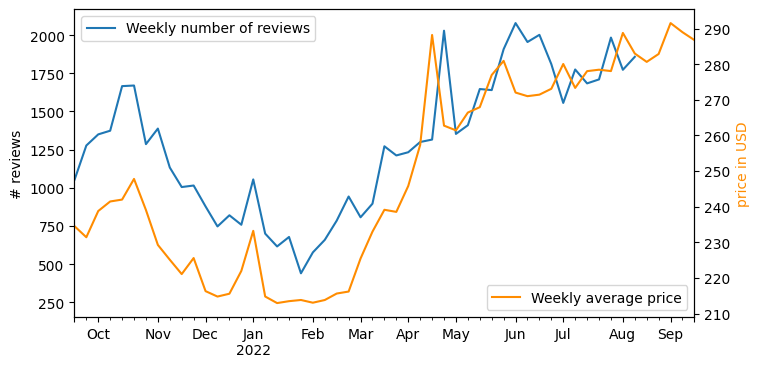

In [132]:
# Let's look a a full year excluding COVID lockdowns
f, ax = plt.subplots(figsize=(8,4))

# Plot number of comments per week
bool_series = reviews["date"].between('2021-8-15', '2022-8-14', inclusive = 'both')
reviews[bool_series].groupby(pd.Grouper(key='date', axis=0, freq='W')).count().plot(y='comments', kind='line', label='Weekly number of reviews', ax=ax)
ax.set_xlabel(None) 
ax.set_ylabel('# reviews') 

# create secondary y axis for the second graph
ax1 = ax.twinx()
ax1.set_ylabel('price in USD', color = 'darkorange')
ax1.set_xlabel(None)
# Select prices over a year using calendar reservation file
bool_series = calendar["date"].between('2022-9-15', '2023-9-14', inclusive = 'both')
serie_prices = calendar[bool_series]['price']
# shift whole timeline index by one year to align with timeline of the comments above
serie_dates = calendar[bool_series].date - timedelta(days=365)
# assemble price series along shifted timeline to get synthetic dataset of price development
prices_df = pd.DataFrame({'date': serie_dates, 'price':serie_prices})
prices_df.groupby(pd.Grouper(key='date', axis=0, freq='W')).mean().plot(y='price',kind='line', label='Weekly average price', ax=ax1, c='darkorange')

# Add legends
ax1.legend(loc='lower right')
plt.show()

### Listings -  Missing values

- Let's look at missing data for selected columns

In [269]:
print('% missing values per column in Listing dataset')
(listings_short.isna().sum(axis=0) / len(listings_short) * 100).round(2)

% missing values per column in Listing dataset


id                         0.00
host_since                 0.00
name                       0.00
description                0.87
property_type              0.00
room_type                  0.00
neighborhood_overview     33.75
neighbourhood_cleansed     0.00
latitude                   0.00
longitude                  0.00
accommodates               0.00
bathrooms_text             0.14
bedrooms                  10.78
beds                       1.37
amenities                  0.00
number_of_reviews          0.00
number_of_reviews_ltm      0.00
number_of_reviews_l30d     0.00
reviews_per_month         23.63
review_scores_rating      23.63
minimum_nights             0.00
maximum_nights             0.00
price                      0.00
dtype: float64

- description, bathroom_text, beds and bedrooms as well as 3 reviews columns have missing values and will require decision

### Listings - Analyze Price distribution

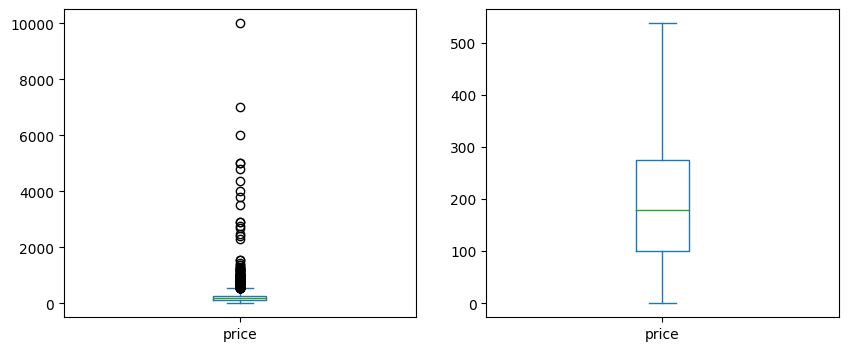

In [160]:
f, ax = plt.subplots(1,2, sharey=False, figsize=(10,4))
listings_short['price'].plot(kind='box',showfliers=True, ax=ax[0])
listings_short['price'].plot(kind='box',showfliers=False, ax=ax[1])
plt.show()

In [161]:
# Number of outliers
print('number of outliers:',len(listings_short[listings_short.price>550]))
print('we will eclude the outliers going forward')

number of outliers: 250
we will eclude the outliers going forward


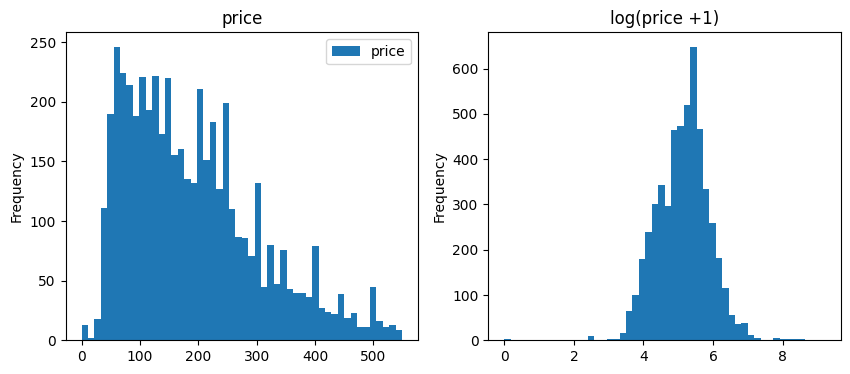

In [167]:
f, ax = plt.subplots(1,2, sharey=False, figsize=(10,4))
listings_short[listings_short.price<550].plot(y='price', kind='hist', bins=50, ax=ax[0], title='price')
np.log(listings_short['price']+1).plot(kind='hist', bins=50, ax=ax[1], title='log(price +1)')
plt.show()

- Let's visualise the property prices in Boston

In [154]:
fig = px.scatter_mapbox(listings_short[listings_short.price<550], lat='latitude', lon='longitude', hover_name="price",color = listings_short[listings_short.price<550]['price'],)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}, width=800, height=800)
fig.update_layout(mapbox_bounds={"west": -71.85, "east": -70.3, "south": 42.21114, "north": 42.43114})
fig.show()

- Price per neighborhood

In [155]:
listings_short['price_per_accommodation'] = listings_short['price']/listings_short['accommodates'] 
neighborhood_price_avg = listings_short.groupby(['neighbourhood_cleansed'])['price_per_accommodation'].mean()
neighborhood_rating_avg = listings_short.groupby(['neighbourhood_cleansed'])['review_scores_rating'].mean()

boston = json.load(open('./maps/map.geojson'))  # source: https://www.kaggle.com/datasets/xujiang1993/boston-geojson?select=map.geojson
fig = px.choropleth_mapbox(neighborhood_price_avg.reset_index(), 
                           geojson=boston, 
                           featureidkey='properties.name', 
                           locations='neighbourhood_cleansed', 
                           color='price_per_accommodation',
                           center={"lat": 42.3201, "lon": -71.0589},
                           mapbox_style="carto-positron",
                           width=1000, height=600,
                           zoom=10
                          )
fig.show()

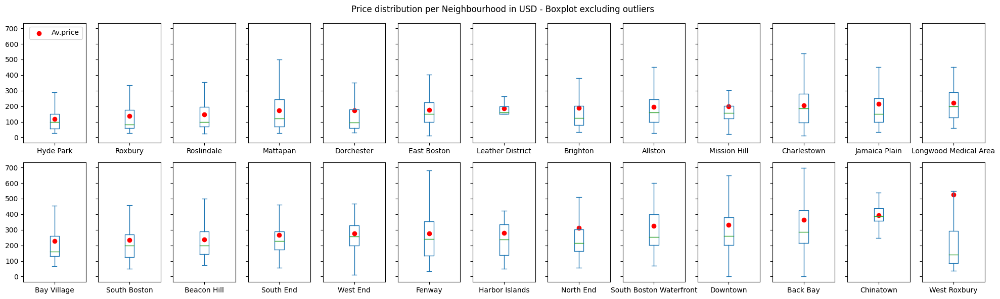

In [164]:
sorted_neighbourhoods = listings_short.groupby('neighbourhood_cleansed').price.mean().sort_values().index.tolist()
n_neighbourhoods = len(sorted_neighbourhoods)
n_cols = int(np.ceil(n_neighbourhoods/2))
f, ax = plt.subplots(nrows=2, ncols=n_cols, sharey=True, figsize=(20,6), squeeze=True)
[listings_short.groupby('neighbourhood_cleansed').get_group(sorted_neighbourhoods[i]).price.plot(kind='box', showfliers=False, label=sorted_neighbourhoods[i], ax= ax[i//n_cols,i%n_cols]) for i in range(n_neighbourhoods)]
[ax[i//n_cols,i%n_cols].scatter(x=[1] , y=listings_short.groupby('neighbourhood_cleansed').get_group(sorted_neighbourhoods[i]).price.mean(), c='r', label='Av.price' if i==0 else '') for i in range(n_neighbourhoods)]
f.suptitle('Price distribution per Neighbourhood in USD - Boxplot excluding outliers')
ax[0,0].legend()
plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.show()

### Listings - overview rating, property type and room type

- rating by neighborhood

In [200]:
fig = px.choropleth_mapbox(neighborhood_rating_avg.reset_index(), 
                           geojson=boston, 
                           featureidkey='properties.name', 
                           locations='neighbourhood_cleansed', 
                           color='review_scores_rating',
                           center={"lat": 42.3201, "lon": -71.0589},
                           mapbox_style="carto-positron",
                           width=1000, height=600,
                           zoom=10,
                           title='Average rating per neighborhood'
                          )
fig.show()

-  property type and room type

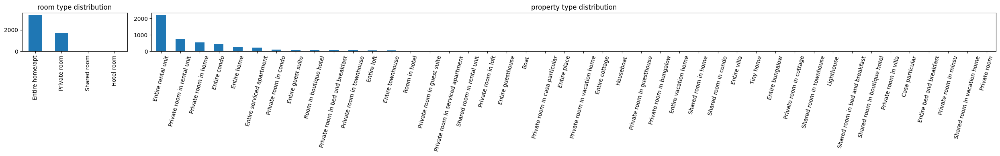

In [203]:
f, ax = plt.subplots(1,2, gridspec_kw={'width_ratios': [1, 8]})
listings_short.room_type.value_counts().plot(kind='bar',  title='room type distribution', ax=ax[0])
listings_short.property_type.value_counts().plot(kind='bar', figsize=(25,4), rot=75, title='property type distribution', ax=ax[1])
plt.tight_layout()
plt.show()

# Q3: Is there a general upward trend of both new Airbnb listings and total Airbnb visitors to Boston?
- To answer this question we will look at the number of unique Airbnb listings and check the number of properties evolution overtime
- we assume 'host_since' reflects the date when hosts registered as a Airbnb guest and increasing the listings of properties
- let's look at the number of listings offered since 2017 using 'host_since' variable

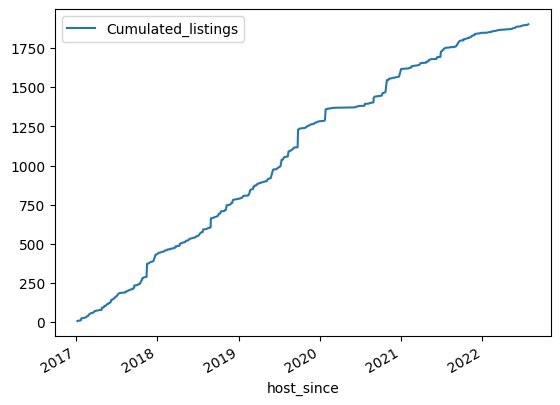

In [204]:
bool_filter = listings_short.host_since.between('2016-12-31', '2022-8-1', inclusive = 'neither')
hosts_count = listings_short[bool_filter].groupby('host_since').count()[['id']]
hosts_count['Cumulated_listings'] = np.cumsum(hosts_count['id'])
hosts_count.plot(y='Cumulated_listings')
plt.show()

- We assume that the number of reviews is a proxy for the number of visitors
- Looking at number of reviews' historical development, we clearly see a growing trend overtime, a "plateau" during COVID lockdowns (2020) and a catch-up starting in H2 2021

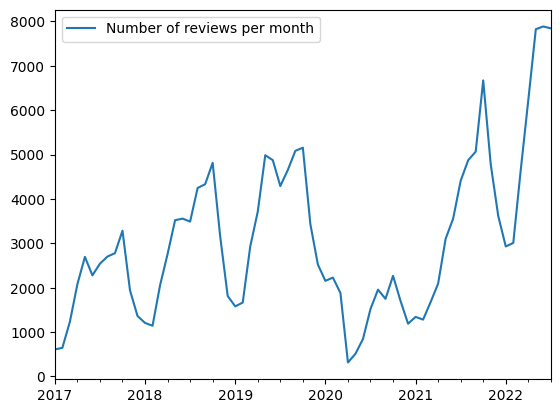

In [206]:
bool_filter = reviews["date"].between('2016-12-31', '2022-8-1', inclusive = 'neither')
reviews[bool_filter].groupby(pd.Grouper(key='date', axis=0, freq='M')).count().plot(y='comments',kind='line', label='Number of reviews per month')
plt.xlabel(None)
plt.show()

### Q3 Conclusion : we observe growing trend in both number of listings and number of visitors
- Let' visualize on a selected scope and combine both metrics
    - we clearly see a growing trend for both metrics despite the drop in 2020 due to COVID
    - follwoing a sharp rebound during 2021, visitors frequentation may be stabilizing in 2022

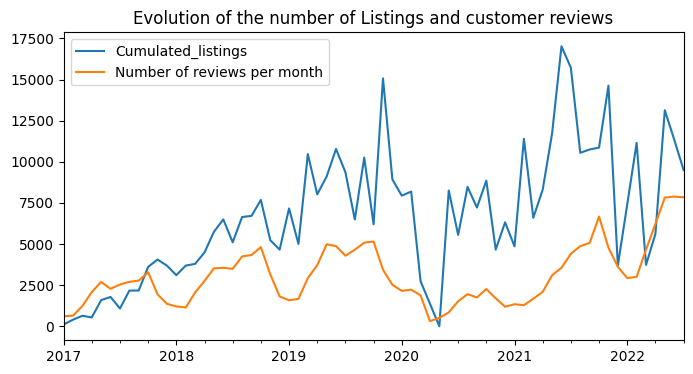

In [207]:
f, ax = plt.subplots(figsize=(8,4))
hosts_count.reset_index().groupby(pd.Grouper(key='host_since', axis=0, freq='M')).sum().plot(y='Cumulated_listings', ax=ax)
reviews[bool_filter].groupby(pd.Grouper(key='date', axis=0, freq='M')).count().plot(y='comments',kind='line', label='Number of reviews per month', ax=ax)
plt.xlabel(None)
plt.title('Evolution of the number of Listings and customer reviews')
plt.show()

# Q4: Can you describe the vibe of each Boston neighborhood using listing descriptions?
- we approach this question by looking at the short description from the hosts about the neighborhood
- we will look at most frequent words after removing stopwords using pke module. pke allows to extract key phrases from a text
- we expect those frequent words to provide an intuition of what each neighborhood offers

In [208]:
# !pip install git+https://github.com/boudinfl/pke.git
import pke

- first, let's collect the neighborhood descriptions as a unique text for each neighborhood
- pke expects a text input to extract key phrases

In [213]:
neighborhood_description = {}
# remove rows without any description
temp = listings_short.dropna(subset='neighborhood_overview')
# group by neighborhood
for nbhood, temp_df in temp.groupby('neighbourhood_cleansed'):
    # assemble the descriptions as a simple text string
    text = temp_df.neighborhood_overview.to_list()
    sampletext = """. """.join(text)
    neighborhood_description[nbhood] = sampletext

In [216]:
print(f'There are {len(neighborhood_description)} neighborhoods in Boston')
list(neighborhood_description.keys())

There are 26 neighborhoods in Boston


['Allston',
 'Back Bay',
 'Bay Village',
 'Beacon Hill',
 'Brighton',
 'Charlestown',
 'Chinatown',
 'Dorchester',
 'Downtown',
 'East Boston',
 'Fenway',
 'Harbor Islands',
 'Hyde Park',
 'Jamaica Plain',
 'Leather District',
 'Longwood Medical Area',
 'Mattapan',
 'Mission Hill',
 'North End',
 'Roslindale',
 'Roxbury',
 'South Boston',
 'South Boston Waterfront',
 'South End',
 'West End',
 'West Roxbury']

- the collected description requires some basic text cleaning

In [219]:
neighborhood_description['Allston'][:500]

'Huron Village is known for its charm.  We have playgrounds, a reservoir, small artisans, a used bookstore, antiques, and two bakery-cafes all within walking distance of Harvard Square.  Not to mention the scrumptious take-out, available in several local places. (URL HIDDEN)<br />(URL HIDDEN). Huron Village is known for its charm.  We have playgrounds, a reservoir, small artisans, a used bookstore, antiques, and two bakery-cafes.  Not to mention the scrumptious take-out, available in several loca'

- we will use a cleaning pre-processing text function and remove stopwords enriched by very common words found in the descriptions

In [222]:
stop_words = set(stopwords.words("english"))
stop_words = stop_words.union(['boston', 'neighborhood', 'minute', 'minutes', 'min', 'mins', 'mile', 'miles', 'walk'])
for nbhood in neighborhood_description.keys():
    stop_words = stop_words.union(nbhood.lower().split())

In [223]:
def preprocess_text(text, stop_words):
    
    #Escaping out HTML characters
    clean_text = html.unescape(text)
    
    # remove hyperlinks
    clean_text = re.sub(r'https?:\/\/.\S+', "", clean_text)

    # remove hashtags
    # only removing the hash # sign from the word
    clean_text = re.sub(r'#', '', clean_text)

    # remove old style retweet text "RT"
    clean_text = re.sub(r'^RT[\s]+', '', clean_text)
    
    # removing mentions
    clean_text = re.sub("@\S+", "", clean_text)
    
    # removing digits
    clean_text = re.sub(r'[0-9]+', '', clean_text)
    
    #Encode from UTF-8 to ascii
    encode_text = clean_text.encode('ascii','ignore')
    #decode from ascii to UTF-8
    clean_text=encode_text.decode(encoding='UTF-8')
    
    # removing stopwords
    clean_text = " ".join([word for word in clean_text.split() if word not in stop_words])

    # lowercasing the text
    clean_text = clean_text.lower()
    
    # remove old html tags
    clean_text = clean_text.replace("<br>", " ")
    clean_text = clean_text.replace("<br />", " ")
    clean_text = clean_text.replace(" />", " ")
    clean_text = re.sub('\n', '', clean_text)
    
    # remove punctuation
    clean_text = "".join([ch for ch in clean_text if ch not in punct])
    
    # eliminate multiple whitespaces
    clean_text = clean_text.strip()
    clean_text = re.sub(' +', ' ', clean_text)
    
    return clean_text

- Clean neighborhood text descriptions

In [224]:
for key in neighborhood_description.keys():
    # clean text for each neighborhood
    neighborhood_description[key] = preprocess_text(neighborhood_description[key], stop_words)

- cleaned text

In [225]:
neighborhood_description['Allston'][:500]

'huron village known charm we playgrounds reservoir small artisans used bookstore antiques two bakerycafes within walking distance harvard square not mention scrumptious takeout available several local places url hidden url hidden huron village known charm we playgrounds reservoir small artisans used bookstore antiques two bakerycafes not mention scrumptious takeout available several local places and were within walking distance harvard square url hidden url hidden if interested apartment please '

- We will now extract key phrases using pke advanced functionalities

In [228]:
def extract_key_phrases(text, pke_extractor='positionrank', pos={'VERB','NOUN', 'PROPN','ADJ'}, topk=5):
    """Extract key phrases from text using pke package
    inputs:
        - text to analyze (string)
        - pke extractor (`positionrank` or `textrank`) 
        - topk number of key phrases to return (integer)
    outputs:
        - topk key phrases as a list of tuples (string, ranking)
    """
    if pke_extractor=='textrank':
        # define the set of valid Part-of-Speeches
        #pos = {'VERB','NOUN', 'PROPN','ADJ'} # 'VERB','NOUN', 'PROPN', 

        # 1. create a TextRank extractor.
        extractor = pke.unsupervised.TextRank()
        # 2. load the content of the document.
        extractor.load_document(input=nlp(text),
                                language='en',
                                normalization='lemmas')
        # 3. build the graph representation of the document and rank the words.
        #    Keyphrase candidates are composed from the 33-percent highest-ranked words.
        extractor.candidate_weighting(window=2,
                                      pos=pos,
                                      top_percent=0.74)
    
    else:
        if pke_extractor!='positionrank':
            print('unreckonized extractor - will use default positionrank extractor')
        
        # 1. initialize keyphrase extraction model
        extractor = pke.unsupervised.PositionRank()
        # 2. load text
        extractor.load_document(input=nlp(text), language='en',
                                normalization='stemming')
        # 3. keyphrase candidate selection
        extractor.candidate_selection()
        # 3. candidate weighting
        extractor.candidate_weighting()       
        
    # 4. get the k-highest scored candidates as keyphrases
    keyphrases = extractor.get_n_best(n=topk, redundancy_removal=True, stemming=False)

    return keyphrases


def word_cloud(nbhood, keyphrase_lst, adjectives_lst): #topk
    """produces two wordcloud based on key phrases and key adjectives extracted from each neighborhood descriptions
    inputs:
        - neighborhood name (string)
        - list of key phrases (list of strings)
        - list of adjectives (list of strings)
    outputs:
        - two worldclouds
    """
    keywords = [] ; adjectives = []
    for keyphrase in keyphrase_lst:
        keywords.extend(keyphrase.split())
        
    for sent in adjectives_lst:
        adjectives.extend(sent.split())
    
    f, ax = plt.subplots(1,2, figsize = (10,8))
    
    print(f'\nWordcloud for neighborhood {nbhood} \n')
    for i, item_lst in enumerate([keywords, adjectives]):
        cloud = WordCloud(stopwords = stop_words, 
                            background_color = 'white',
                            width=2500, height=1800
                         ).generate(" ".join(item_lst))
    
        ax[i].imshow(cloud)
        ax[i].axis('off')
    plt.show()

************** Allston **************


street porter square shopping center porter square mbta t subway station commuter rail lesley university harvard law school davis square subway ride harvard collegeharvard square subway ride mit mgh subway ride boston mile harvard mile public library mile
press jp licks clubs bars allston paradise club coolidge theater downtown boston miles drive public transport newburry street miles drive public transport bostons children hospital miles drive walk beth israel deaconess medical center mile drive harvard vanguard hospital miles drive walk brigham womens hospital miles drive walk mount auburn hospital miles drive public transport boston university
harvard square porter square cambridge porter square subway commuter rail station min walk harvard law school half mile lesley college quarter mile tufts university mile great restaurants coffee shops
childrens hospital chestnut hill reservoir lake driving t subway boston college driving t subway boston university driving t subway harvard univ


Wordcloud for neighborhood Allston 



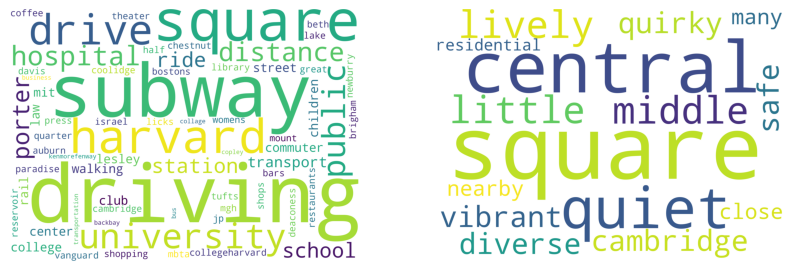


************** Back Bay **************


back bay stuart st drive boston sports club boylston st drive barrys boston back bay stuart st drive walk
back bay stuart st drive boston sports club boylston st drive barrys boston back bay stuart st drive codes uber
back bay stuart st approx drive boston sports club boylston st approx drive barrys boston back bay stuart st approx drive
line orange line newburry st prudential center boston common park northeastern copley sq fenway park boston medical tons places
newbury st hynes convention center prudential center fashionable newbury street shops restaurants boylston street shops restaurants



Wordcloud for neighborhood Back Bay 



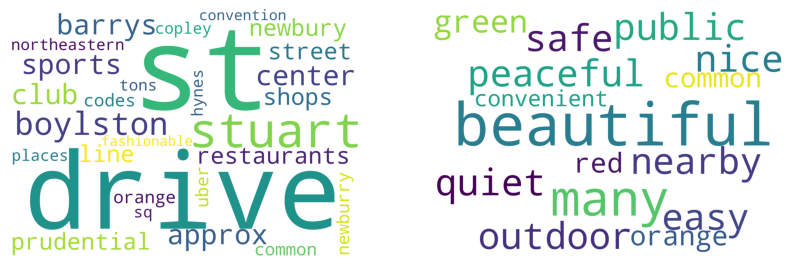


************** Bay Village **************


walk beacon hill walk faneuil hallfinancial districtnorth endfort point walk cab seaport walk cab bay village boston
north end freedom trail museum fine arts boston faneuil hall marketplace boston common
theatre district walk chinatown walk esplanadecharles river walk
cutler majestic theatre historic boston opera house comedy music acts perform wilbur lowkey
walk boston commons walk prudential



Wordcloud for neighborhood Bay Village 



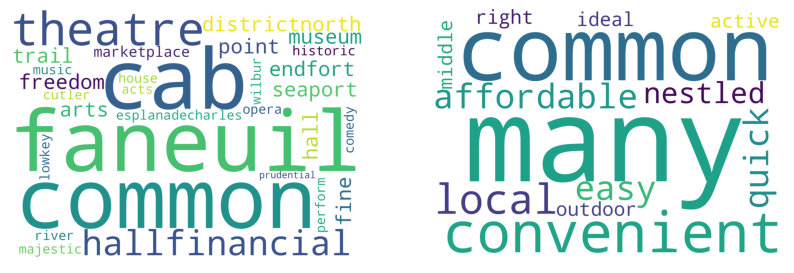


************** Beacon Hill **************


beacon hill beacon hill beacon hill beacon hill heart boston beacon hill
mass general public gardens charles river boston common bay government center fanuel hall freedom trail beacon hill boston
streets gas lamps beacon hill home massachusetts state house charles street neighborhoo beacon hill
boston lonely planet beacon hill beacon hill picturesque boston
streets gas lamps beacon hill home massachusetts state house charles street neighborhoo historic



Wordcloud for neighborhood Beacon Hill 



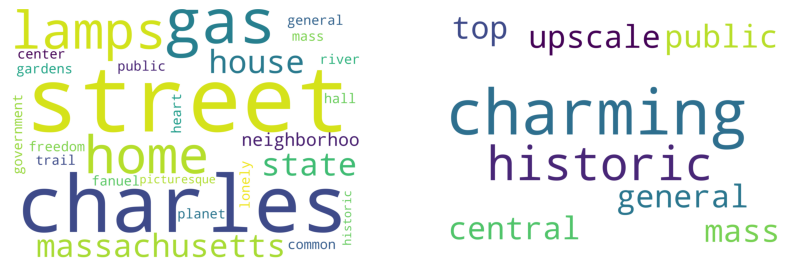


************** Brighton **************


corner boston brightonbrooklineallston area convenient location public transportation public transportation b line subwaytrain close boston university boston college harvard university mit longwood medical area boston logan airport
b c d trains easy access downtown boston fenway park boston college boston university st elizabeths longwood medical bostons tourist attractions bc
steps t close boston college boston university longwood medical area harvard business school fenway park great boston
street steps public transportation boston college boston university easy access boston tourist attractions newton
c d b trains easy commute boston longwood medical hospitals boston college boston university st elizabeths bostons tourist attractions



Wordcloud for neighborhood Brighton 



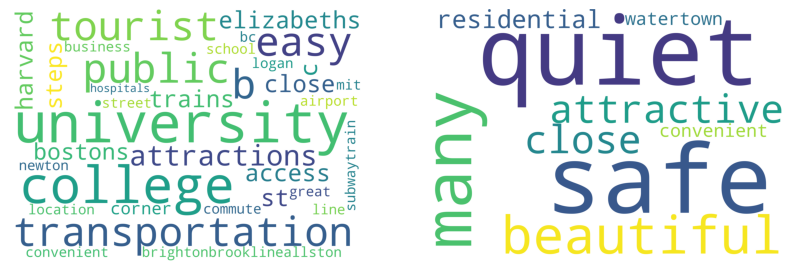


************** Charlestown **************


uberlyft ride encore casino boston harvard mit fenway park airport faneuil hall downtown boston mass general hospital boston common new england aquarium union square inman square
uberlyft ride encore casino boston harvard mit fenway park airport faneuil hall downtown boston mass general hospital boston common new england aquarium house
foods market prospect st cambridge ma oleana restaurant hampshire st cambridge ma bondir restaurant broadway cambridge ma hampshire market hampshire st cambridge ma east coast grill raw bar cambridge st cambridge ma
airport encore casino boston harvard mit fenway park faneuil hall downtown boston mass general hospital boston common new england aquarium
neighborhood stores restaurants pharmacy post office encore casino drive boston bus right corner boston



Wordcloud for neighborhood Charlestown 



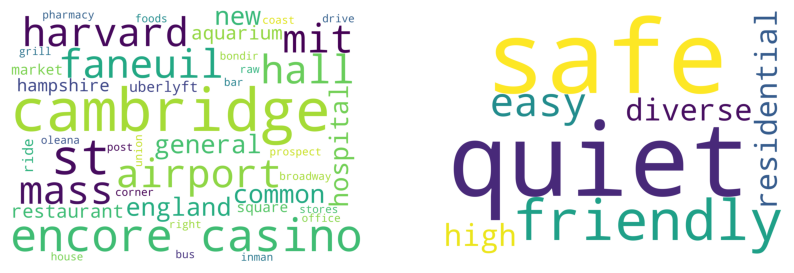


************** Chinatown **************


north end theater district chinatown downtown boston
district chinatown bostons downtown financial district
street parking bostons downtown financial district
entertainment dining venues city right intersection theatre district
garden seaport district little italy quincy market bars



Wordcloud for neighborhood Chinatown 



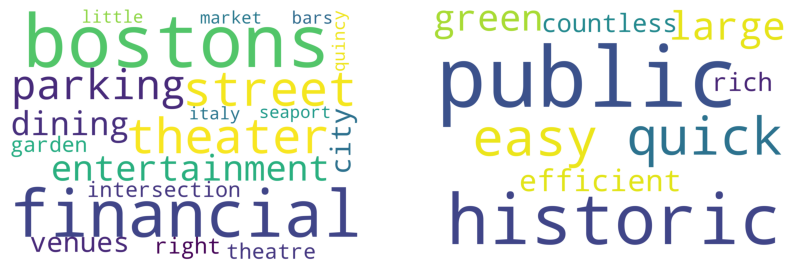


************** Dorchester **************


art miles minutes christopher columbus waterfront park miles minutes clifford playground miles minutes carson beach miles minutes castle island miles minutes savin hill malibu beach miles minutes wollaston beach miles minutes marina bay miles minutes brothers supermarket dudley street minute walk cvs dudley street minute walk star market miles minutes amc south bay center district ave dorchester ma miles minutes south bay center shopping mallmiles minutes neighborhood franklin zoo park miles minutes
art miles minutes christopher columbus waterfront park miles minutes clifford playground miles minutes carson beach miles minutes castle island miles minutes savin hill malibu beach miles minutes wollaston beach miles minutes marina bay miles minutes brothers supermarket dudley street minute walk cvs dudley street minute walk star market miles minutes amc south bay center district ave dorchester ma miles minutes south bay center shopping mallmiles minutes proximity destinations interest
hou


Wordcloud for neighborhood Dorchester 



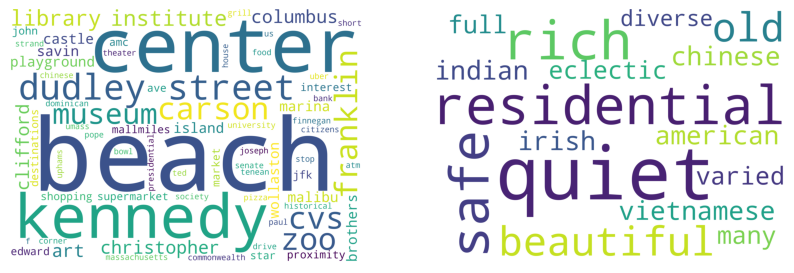


************** Downtown **************


north end freedom trail museum fine arts boston faneuil hall marketplace boston common pristine boston location score public transportation score
downtown boston walk city center shopping dining financial district theater district boston common public
boston opera house comedy music acts perform wilbur lowkey pubs walking distance boston common financial district north end south end
center downtown crossing shops restaurants boston common public garden seaport district little italy quincy market bars
sail boston harbor catch show boston opera house munch cannoli north end



Wordcloud for neighborhood Downtown 



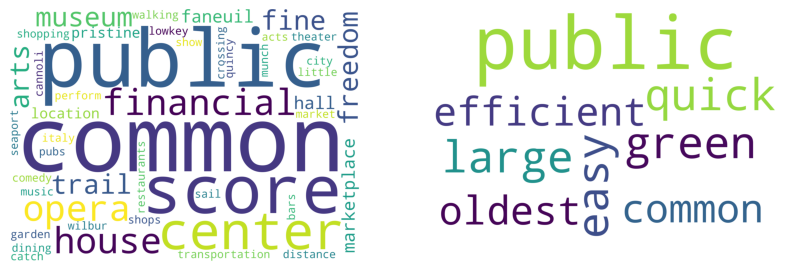


************** East Boston **************


arts miles universities suffolk university miles massachusetts institute technology miles boston university miles tufts university miles northeastern university miles university massachusetts boston miles harvard university miles boston college miles beaches revere beach miles winthrop shore reservation miles donovan beach miles yirrell beach miles
reservation miles universities suffolk university miles boston university miles northeastern university miles university massachusetts boston miles massachusetts institute technology miles harvard university miles tufts university miles boston college miles airport boston logan
hospitals distances mgh drive mgh chelsea drive brigham womens drive boston childrens drive tufts medical center drive shriners childrens hospital drive partners healthcare assembly drive east boston cultural hot spot delicious cuisine world historic buildings
view boston harbor distances boston attractions aquarium miles north end miles td garden miles quincy marketf


Wordcloud for neighborhood East Boston 



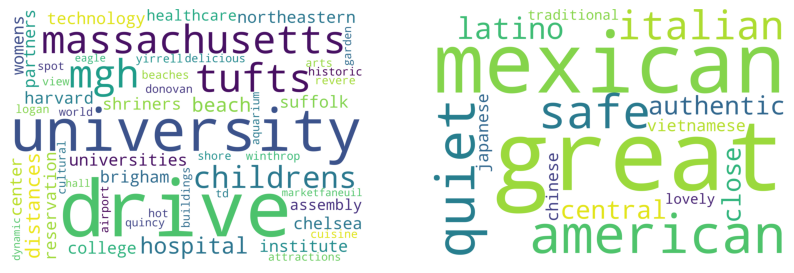


************** Fenway **************


parks edge boston attractions fenway park miles newbury street miles museum fine arts boston miles isabella stewart gardner museum miles faneuil hall marketplace miles new england aquarium miles
garden miles charles river esplanade miles boston common miles beaches carson beach miles l street beach miles m street beach miles malibu beach miles castle island miles nightlife
destinations north end freedom trail museum fine arts boston faneuil hall marketplace boston common kenmore square fenway park bostons back bay boston university longwood medical center short trip foot train taxi uber
distance harvard mit central kendall square bu fenway park boston red green lines charles river cambridgeport part cambridge dips boston
door kenmore square fenway park bostons back bay boston university longwood medical center short trip foot train taxi uber



Wordcloud for neighborhood Fenway 



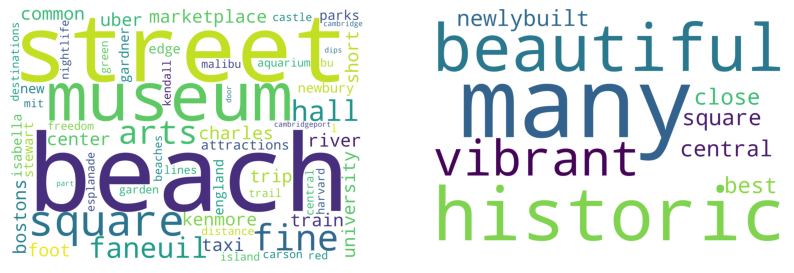


************** Harbor Islands **************
boston harbor light house close airport bus stop beach boston
restaurants cafe ice cream libations convenience store
boats day georges island hingham
boston work fun
north end logan airport

Wordcloud for neighborhood Harbor Islands 



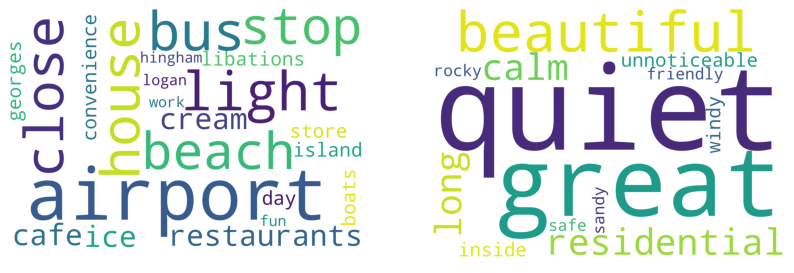


************** Hyde Park **************
bostons theater district jamaica pond harvard universitys arnold arboretum legacy place downtown boston boston commons fenway park gillette stadium td garden franklin park zoogolf gas grocery wine liquor stores
dining options hyde park boston hyde park southernmost boston massachusetts united states
boston walking distance boston fenway park square root rozzie
hyde park part boston southern side city
lyft ride credit hyde park southernmost part boston



Wordcloud for neighborhood Hyde Park 



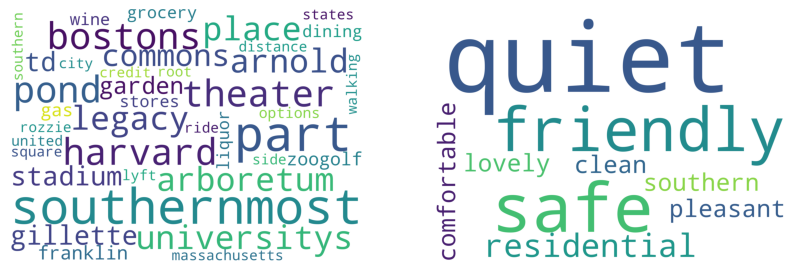


************** Jamaica Plain **************


beach miles malibu beach miles l street beach miles m street beach miles medal honor park miles pleasure beach miles nearby restaurants miles simcos boston house pizza pleasant cafe la taqueria la lechonera perla del sur airport boston
beautiful victorian homes family run market coffee shop pizza sushi restaurants minutes jamaica pond green line d train bus jamaica plain jp
jamaica pond main street jamaica plain coffee shops restaurants short
lots green space jamaica pond arnold arboretum southwest corridor park jamaica plain
hospital mile grocery stores wholefood stopshop cvs mile transportation stony brook subway station busses cross street top attractions jamaica plain arnold arboretum



Wordcloud for neighborhood Jamaica Plain 



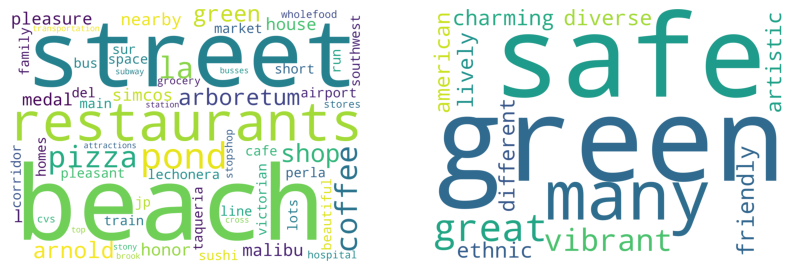


************** Leather District **************
transportation catch red green blue orange t lines
shopping downtown crossings faneuil
district entertainment downtown shopping
station movie theater shopping td
center chinatown placing center

Wordcloud for neighborhood Leather District 



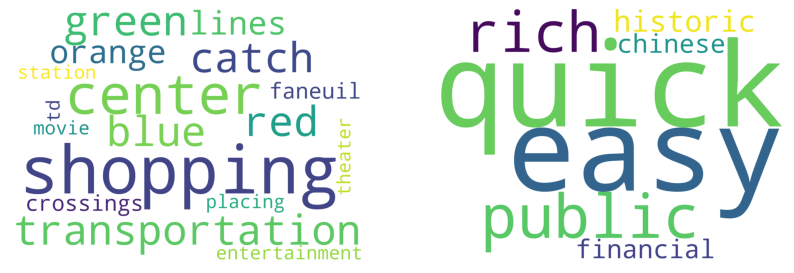


************** Longwood Medical Area **************


jfk national historic site birthplace home fenway park longwood medical area steps coolidge corner historic movie theater trader joes
coolidge corner steps coolidge corner historic movie theater trader joes
downtown boston hop subway time coolidge corner
downtown shopping restaurants boston college northeastern university
shopping restaurantsmovie theater trader joesstop shop bakerys drug stores coffee shops



Wordcloud for neighborhood Longwood Medical Area 



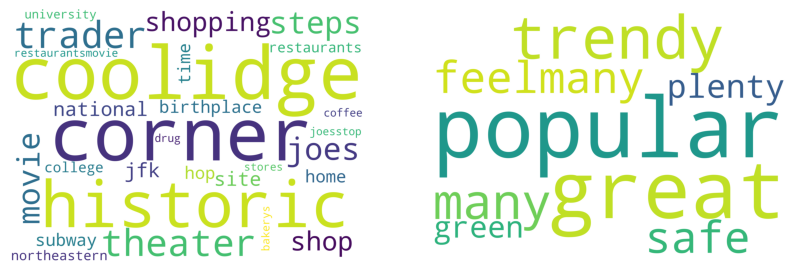


************** Mattapan **************
hospital north eastern university wentworth institute technology boston college longwood medical area beth israel deaconess hospital children hospital brigham woman
hospital massachusetts eye ear museum fine arts td garden mit institute contemporary art fenway park harvard boston
boston short supermarketpharmacy steel rye homemade ice cream coffee shops restaurants
sides neponset river dorchester boston town milton massachusetts
shops mattapan square branch boston public library



Wordcloud for neighborhood Mattapan 



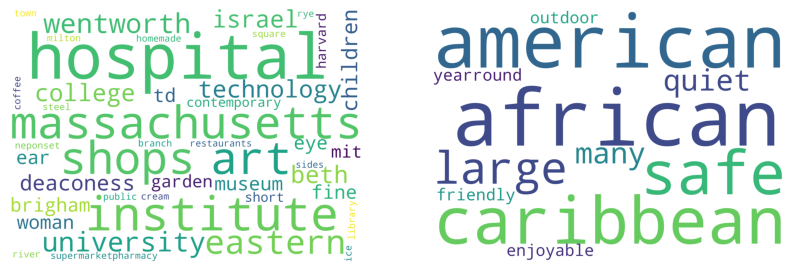


************** Mission Hill **************


airport miles universities harvard medical school miles mass college art design miles mass college pharmacy miles simmons university miles boston university miles
fenway park mile boston marathon finish line miles newbury st miles museum fine arts miles isabella stewart gardner museum miles boston
green line td garden green line charles river esplanade miles boston symphony hall miles boston
foot miles prudential center miles copley place miles freedom trail miles faneuil hall green line
boston walking distance longwood medical area parks restaurants shops public transportation



Wordcloud for neighborhood Mission Hill 



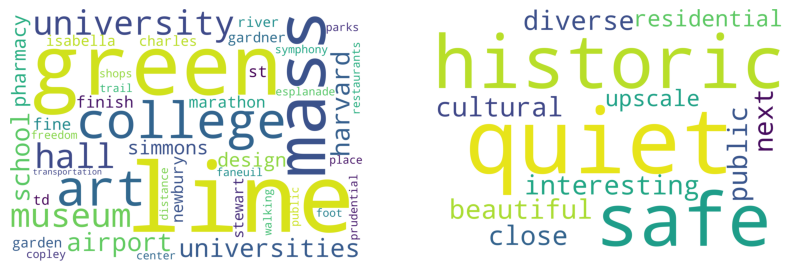


************** North End **************


boston quincy market boston common north end
quincy market faneuil hall financial district boston seaport bostons north end
boston celtics boston bruins game td bank arena
walk walk freedom trail waterfront north end faneuil hall beacon hill mgh hospitals
boston bostons little italy north end



Wordcloud for neighborhood North End 



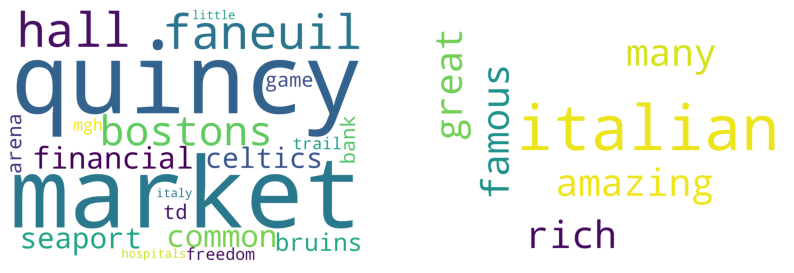


************** Roslindale **************
hyde park avenue washington street train lines forest hills orange line roslindale square commuter rail station roslindale square
address south st roslindale ma shanti indian address washington st roslindale ma birch street
address birch st roslindale ma village sushi address corinth st roslindale ma
access city break hustle bustle roslindale village boston house
arnold arboretum roslindale square public transportation roslindale



Wordcloud for neighborhood Roslindale 



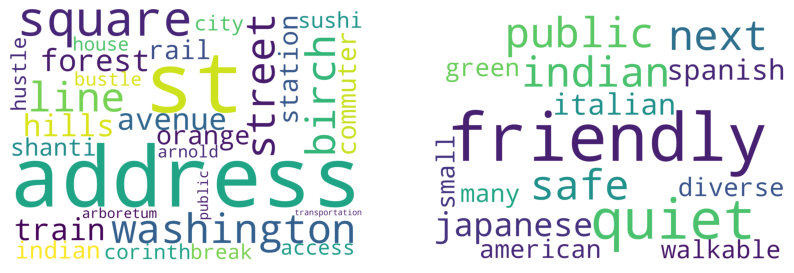


************** Roxbury **************


art miles new england aquarium miles jfk presidential library museum miles boston tea party ship museum miles custom house tower miles colleges northeastern university miles boston university miles boston college miles harvard university miles
miles boston public garden miles boston harbor cruises miles boston
attractions close boston public library prudential center charles playhouse boston opera house boston
public library ymca close stony brook station jackson square station orange line franklin park egleston square egleston square branch boston public library
franklin park zoo arnold arboretum samuel adams brewery museum fine arts isabella stewart gardner museum emerald necklace jamaica pond back bay prudential center newbury street



Wordcloud for neighborhood Roxbury 



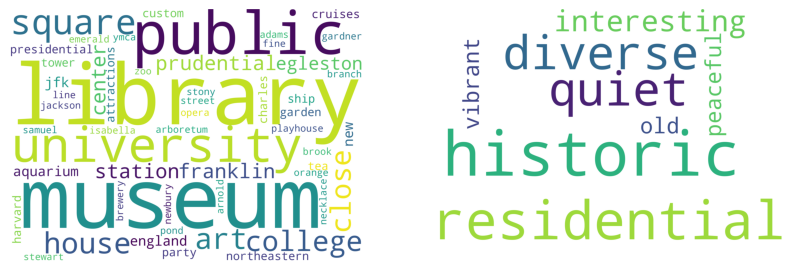


************** South Boston **************


park miles m street beach miles pleasure beach miles l street beach miles carson beach miles malibu beach miles downtown destinations castle island miles
logan airport boston south station drive boston cruise port boston convention exhibition center south boston southie
institute contemporary art miles boston tea party ships museum miles boston waterfront miles new england aquarium miles
intersection east west broadway street south boston easy access public transportation walking distance seaport downtown boston
neighborhoods boston convention exhibition center bcec miles summer st boston ma seaport district miles



Wordcloud for neighborhood South Boston 



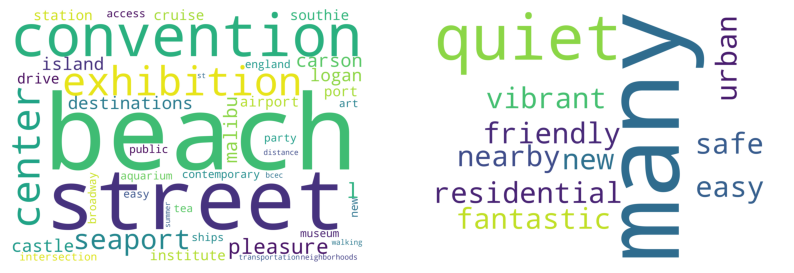


************** South Boston Waterfront **************
groceries trillium flour lolita bastille kitchen blue dragon oak rowan sportello menton drink row bar taco dig inn committee trader
seaport south boston financial district fort point
blocks ica childrens museum tea party museum restaurants convention center
drive south boston great place base proximity heart city
boston feel proximity downtown bar pub scene



Wordcloud for neighborhood South Boston Waterfront 



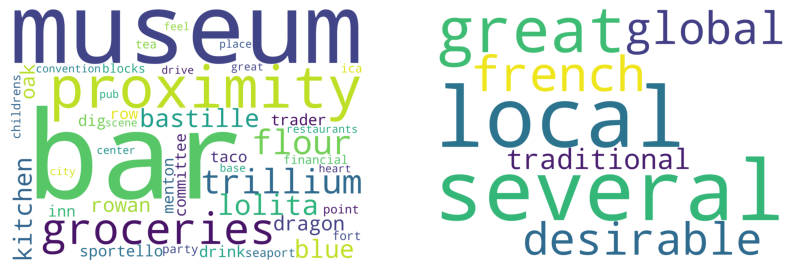


************** South End **************


market restaurants bars foodies supermarket cvs pharmacy back bay train station orange line subway amtrak copley mall copley square copley subway copley hotels westin marriott fairmont boston public library hancock tower boston duck tours
boston copley sq prudential mall boston marathon finish line newbury st boston common garden swan boats restaurants
back bay stuart st drive boston sports club boylston st drive barrys boston back bay stuart st drive south end
back bay mbta station orange line subway train station walk boston public library walk newbury street walk star market walk
south end home boston center arts bca school boston



Wordcloud for neighborhood South End 



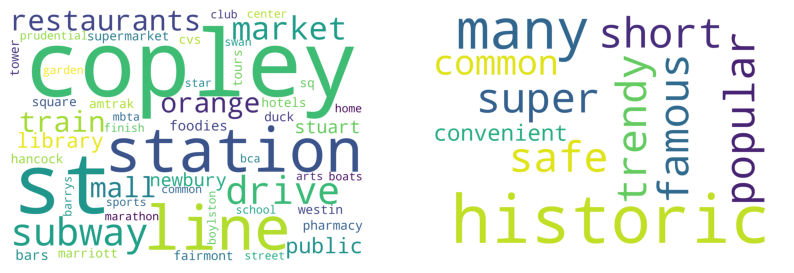


************** West End **************


harvard square banks charles river cambridgeside galleria mall massachusetts institute technology harvard university harvard museum
garden faneuil hall charles river esplanade museum science td garden mass general hospital
distance boston charles river pristine boston location score
blocks house neighboring cambridgeside mall kendall square short harvard square
transportation td boston garden sports concert events charles river esplanade



Wordcloud for neighborhood West End 



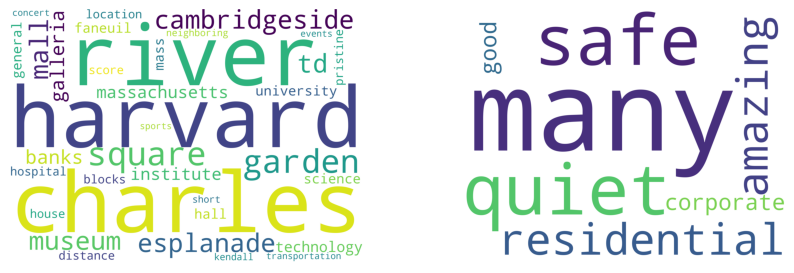


************** West Roxbury **************
proximity boston college boston university pine manor college
distance pharmacy cvs banks citizens bank brookline bank restaurants coffee shops
city chestnut mall chestnut shopping center brookline boston
boston longwood medical area train station bus stop
dedham couple blocks west roxbury boston neighborhood



Wordcloud for neighborhood West Roxbury 



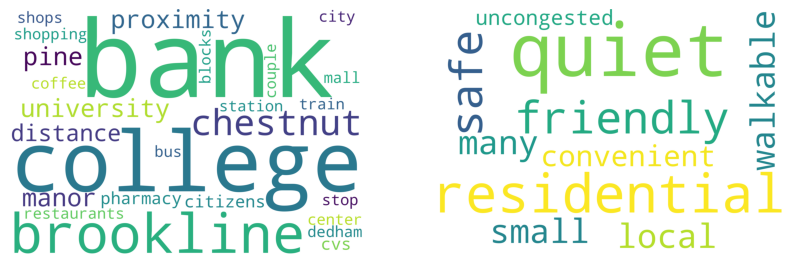

In [229]:
for key in neighborhood_description.keys():
    keyphrase_lst = [] ; adjectives_lst = []
    print(f'************** {key} **************')
    
    # extract keywords using either textrank or  positionrank extractor
    keyphrases = extract_key_phrases(neighborhood_description[key], 'textrank', {'NOUN','PROPN'})  #textrank, positionrank
    for keyphrase, _ in keyphrases:
        print(keyphrase)
        keyphrase_lst.append(keyphrase)

    adjectives = extract_key_phrases(neighborhood_description[key], 'textrank', {'ADJ'})  #textrank, positionrank
    for adjective, _ in adjectives:
        adjectives_lst.append(adjective)
        
    word_cloud(key, keyphrase_lst, adjectives_lst)
    print()

### Q4 conclusion
- we could describe each neighborhood from the descriptions provided by the hosts using NLP techniques

# Q5: Can you predict the rental price of a new property based on available features ?
- our objective is to find the best features to predict the price of a rental property
- we will evaluate a property based on available features provided by hosts on Airbnb platform
- we want to propose a price-point for a new property not having any reviews or rating yet. Therefore we will exclude those features in a first step to first assess prediction capabilities and performance taking this as a constraint
- we will use a combination of continuous, numeric, and categorical features
- we will include some text features such as the property description, name or bathroom text
- we will focus on the average price from the listings dataset and not consider the daily prices available in the calendar dataset

- REMINDER: description, bathroom_text, beds and bedrooms have missing values necessitating attention. we will also take care of the 3 reviews missing columns at the same time

In [231]:
# We select a set of features specific to the property capacity, its localization (the neighborhood), and the associated services (list of amenities)
# These are expected to have significant prediction power on the property rental price
# Reminder: 'bathrooms' column does not contain any information and has been excluded
features = [ 'property_type','room_type', 'accommodates','bedrooms','beds','neighbourhood_cleansed','latitude','longitude','bathrooms_text','amenities','number_of_reviews']  #'number_of_reviews_ltm','number_of_reviews_l30d','reviews_per_month','review_scores_rating'
# dependent variable, ie what we want to predict
target_variable = 'price'

In [235]:
listings[features+['price']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5185 entries, 0 to 5184
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   property_type           5185 non-null   object 
 1   room_type               5185 non-null   object 
 2   accommodates            5185 non-null   int64  
 3   bedrooms                4626 non-null   float64
 4   beds                    5114 non-null   float64
 5   neighbourhood_cleansed  5185 non-null   object 
 6   latitude                5185 non-null   float64
 7   longitude               5185 non-null   float64
 8   bathrooms_text          5178 non-null   object 
 9   amenities               5185 non-null   object 
 10  number_of_reviews       5185 non-null   int64  
 11  price                   5185 non-null   float64
dtypes: float64(5), int64(2), object(5)
memory usage: 486.2+ KB


- Let's look at the cardinality of the categorical features

In [236]:
for feature in ['property_type','room_type', 'bedrooms','beds','bathrooms_text']:
    print(f'******************* {feature} *******************')
    print(listings[feature].value_counts())
    print()

******************* property_type *******************
Entire rental unit                    2235
Private room in rental unit            768
Private room in home                   537
Entire condo                           449
Entire home                            272
Entire serviced apartment              222
Private room in condo                  109
Entire guest suite                      88
Room in boutique hotel                  81
Private room in bed and breakfast       79
Private room in townhouse               73
Entire loft                             58
Entire townhouse                        53
Room in hotel                           33
Private room in guest suite             18
Private room in serviced apartment      14
Shared room in rental unit              13
Private room in loft                    11
Entire guesthouse                       11
Boat                                     8
Private room in casa particular          8
Entire place                             5


# 4- Cleaning missing data
- about 11% of the `bedrooms` and 1% `beds` data are missing ==> we will impute beds based on the number of accomodates and predict bedrooms based on beds
- less than 0% `bathrooms_text` is missing ==> we will impute using most frequent item
- 33% of `neighborhood_overview` is missing - we already used this information and will not keep for price regression as we will use the `neighbourhood_cleansed`instead
- Less than 1% of `description` is missing. We will use the available very short `name` for those situations
- Finally we will impute the 24% missing `review_scores_rating` using most frequent and `reviews_per_month` using 1/12 of `number_of_reviews_ltm`

In [270]:
listings_short = listings[keep_columns].copy()
print('% missing values per column in Listing dataset')
(listings_short.isna().sum(axis=0) / len(listings_short) * 100).round(2)

% missing values per column in Listing dataset


id                         0.00
host_since                 0.00
name                       0.00
description                0.87
property_type              0.00
room_type                  0.00
neighborhood_overview     33.75
neighbourhood_cleansed     0.00
latitude                   0.00
longitude                  0.00
accommodates               0.00
bathrooms_text             0.14
bedrooms                  10.78
beds                       1.37
amenities                  0.00
number_of_reviews          0.00
number_of_reviews_ltm      0.00
number_of_reviews_l30d     0.00
reviews_per_month         23.63
review_scores_rating      23.63
minimum_nights             0.00
maximum_nights             0.00
price                      0.00
dtype: float64

### Imputing missing values

In [271]:
def impute_missing_beds(row):
    if pd.isnull(row['beds']):
        # we assume double beds and complement with a simple bed
        row['beds'] = row['accommodates'] // 2 + row['accommodates'] % 2
    return row

listings_short = listings_short.apply(impute_missing_beds, axis=1)

In [272]:
temp_df = listings_short.dropna(axis=0, subset=['beds','accommodates','bedrooms'])
#Create a Linear Regression model to estimate the missing data
bedroom_imputer = LinearRegression()
bedroom_imputer.fit(X = temp_df[['beds','accommodates']].values, y = temp_df['bedrooms'])

LinearRegression()

In [273]:
def impute_missing_bedrooms(row):
    if pd.isnull(row['bedrooms']):
        # we predict the number of bedrooms using beds and accommodates
        row['bedrooms'] = np.ceil(bedroom_imputer.predict([row[['beds','accommodates']]]).item())
    return row

listings_short = listings_short.apply(impute_missing_bedrooms, axis=1)

- there are some missing data in `bathroom_text` (as well as `review_scores_rating`)
- we will impute using most frequent item

In [274]:
bathroom_imputer = SimpleImputer(strategy='most_frequent')
bathroom_imputer.fit(listings_short[['review_scores_rating','bathrooms_text']])

SimpleImputer(strategy='most_frequent')

In [275]:
listings_short.loc[:,['review_scores_rating','bathrooms_text']] = bathroom_imputer.fit_transform(listings_short[['review_scores_rating','bathrooms_text']])

- Finally, let's impute missing `reviews_per_month` using `number_of_reviews_ltm`

In [276]:
def impute_reviews_per_month(row):
    if pd.isna(row['reviews_per_month']):
        row['reviews_per_month'] = row['number_of_reviews_ltm'] / 12
    return row

listings_short = listings_short.apply(impute_reviews_per_month, axis=1)

In [277]:
print('% missing values per column in Listing dataset')
(listings_short.isna().sum(axis=0) / len(listings_short) * 100).round(2)

% missing values per column in Listing dataset


id                         0.00
host_since                 0.00
name                       0.00
description                0.87
property_type              0.00
room_type                  0.00
neighborhood_overview     33.75
neighbourhood_cleansed     0.00
latitude                   0.00
longitude                  0.00
accommodates               0.00
bathrooms_text             0.00
bedrooms                   0.00
beds                       0.00
amenities                  0.00
number_of_reviews          0.00
number_of_reviews_ltm      0.00
number_of_reviews_l30d     0.00
reviews_per_month          0.00
review_scores_rating       0.00
minimum_nights             0.00
maximum_nights             0.00
price                      0.00
dtype: float64

- Correlation matrix between features (independent and dependent variables)

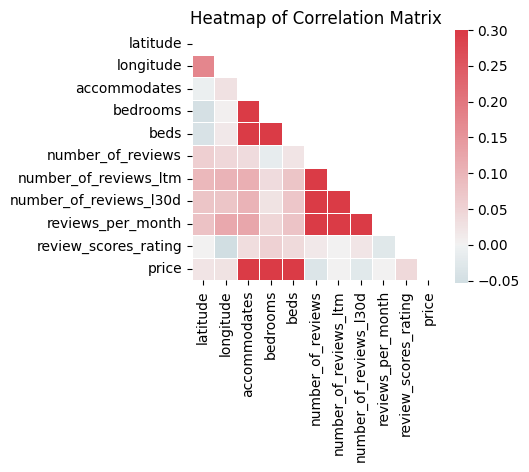

In [295]:
# Generate our correlation plot or heatmap
corr = listings_short[listings_short.columns.intersection(features+['number_of_reviews_ltm','number_of_reviews_l30d','reviews_per_month','review_scores_rating','price'])].corr(numeric_only=True)
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize = (4,4))
cmap = sns.diverging_palette(220,10,as_cmap = True)
sns.heatmap(corr,xticklabels=corr.columns.values, yticklabels=corr.columns.values,cmap=cmap,vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .82}, mask=mask)
plt.title('Heatmap of Correlation Matrix')
plt.show()

- Insights CORRELATION MATRIX:
    - price is strongly correlated with the capacity of the property (accommodates, number of bedrooms and number of beds)
    - excepted `review_scores_rating`, all the others features see to be weakly correlated
    - as expected accommodates, bedrooms and beds appear somehow correlated together
    - same for the number of reviews with other calculated review counting metrics

- We prepare a cleaned dataset with selected features and no missing values which we are now going to enrich with information extracted from the amenities and description text-based features

In [368]:
subset_df = listings_short[features[:-1]+['price']]
subset_df

,property_type,room_type,accommodates,bedrooms,beds,neighbourhood_cleansed,latitude,longitude,bathrooms_text,amenities,price
0,Private room,Private room,2,2.0,1.0,Brighton,42.351480,-71.193190,1 shared bath,"[""Dishes and silverware"", ""Long term stays all...",99.0
1,Entire rental unit,Entire home/apt,2,1.0,1.0,East Boston,42.364130,-71.029910,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",132.0
2,Entire guest suite,Entire home/apt,2,1.0,1.0,Roxbury,42.328440,-71.095810,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",149.0
3,Entire condo,Entire home/apt,4,2.0,2.0,Roxbury,42.328020,-71.093870,1 bath,"[""Dishes and silverware"", ""Long term stays all...",179.0
4,Private room in condo,Private room,1,1.0,1.0,Charlestown,42.390310,-71.093610,1.5 shared baths,"[""Bed linens"", ""Rice maker"", ""Dishes and silve...",116.0
...,...,...,...,...,...,...,...,...,...,...,...
5180,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.331485,-71.051420,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",51.0
5181,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.332679,-71.053346,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",51.0
5182,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.333266,-71.051323,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",51.0
5183,Private room in rental unit,Private room,2,1.0,1.0,Brighton,42.353218,-71.162178,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",51.0


- `amenities` column contains list of strings. Strings can be just one amenity item or several items separated by commas. We want to collect all individual items from these strings
- Let's then make column vectors for each amenities element. A property offering an amenity will be coded as 1 and 0 otherwise

In [369]:
# we first collect the strings
amenities_lst = set()
for elements in subset_df.amenities:
    amenities_lst.update(ast.literal_eval(elements))
# in a second pass we collect all individual items from those stings
# I use a set() to remove duplicates
amenities_items= set()
for item in amenities_lst:
    amenities_items.update(item.split(', '))
print(f'We isolated a list of {len(amenities_items)} different amenities')

We isolated a list of 1125 different amenities


- We will now build the column vectors for each of the amenity found

In [370]:
from itertools import chain

In [372]:
# Ititialize a 0-vector for each item
for item in amenities_items:
    subset_df[item] = 0
# Let's build a helper column with list of all amenities offered by each property
subset_df['amenities_copy'] = subset_df['amenities'].copy()
subset_df['amenities_copy'] = subset_df['amenities_copy'].progress_apply(lambda x: [i.split(', ') for i in ast.literal_eval(x)])
subset_df['amenities_copy'] = subset_df['amenities_copy'].progress_apply(lambda x: list(chain(*x)))
# Now populate the column vectors for existing items depending on whether it is offered by the rental property (1) or not (0)
for item in tqdm(amenities_items):
    subset_df[item] = subset_df['amenities_copy'].apply(lambda x: 1 if item in x else 0)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1125/1125 [00:05<00:00, 199.84it/s]


In [373]:
# Let's drop the encoded columns we do not need anymore
subset_df.drop(['amenities','amenities_copy'], axis=1, inplace=True)
# check populated vector columns
subset_df[list(amenities_items)].sum().sum()

153024

In [374]:
# here is the populated column vectors
subset_df[list(amenities_items)]

,Cooking basics,"42"" HDTV with HBO Max",Hot tub,Electric stove,"43"" HDTV with",Safe,Paid dryer,Grove body soap,"43"" HDTV with Netflix",Game console: PS3,...,6 burner professional stainless steel stove,"50"" TV with Netflix",Game console: Nintendo Wii,DOVE Usually body soap,"50"" HDTV with",Sonos sound system with Bluetooth and aux,walk-in closet,Clothing storage: wardrobe,conditioner and body wash/soap (irish spring) are stocked for guests in bathroom shower and wall cabinet body soap,Shower gel
0,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5181,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5182,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5183,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [289]:
# List of top 20 most represented amenities
subset_df[list(amenities_items)].sum(axis=0).sort_values(ascending=False).head(20)

Smoke alarm                4986
Wifi                       4889
Long term stays allowed    4875
Carbon monoxide alarm      4745
Kitchen                    4660
Essentials                 4477
Hangers                    4320
Heating                    4212
Hair dryer                 4191
Iron                       4152
Hot water                  3941
Shampoo                    3807
Refrigerator               3738
Microwave                  3659
Coffee maker               3502
Air conditioning           3434
Dishes and silverware      3313
Bed linens                 3242
Cooking basics             3034
Fire extinguisher          2965
dtype: int64

In [375]:
print(f'We now have a dataset of shape {subset_df.shape}')

We now have a dataset of shape (5185, 1135)


# 5- Data segregation

In [297]:
def drop_outliers(df, target):
    y = df[target]
    IQR =  y.quantile(0.75) - y.quantile(0.25)
    upper_lim = y.quantile(0.75) + 1.5 * IQR
    lower_lim = max(0, y.quantile(0.25) - 1.5 * IQR)
    boolean_filter = y.between(lower_lim, upper_lim)
    return df[boolean_filter]

In [298]:
def data_segregation(df, target, cat_features, drop_outlier=False):
    
    if drop_outlier:
        df = drop_outliers(df, target)
    
    X = df.copy()
    y = X.pop(target)
    print(f'X shape before one-hot encoding {X.shape}')
    
    dummy_cols_X = pd.get_dummies(X[cat_features], dummy_na=False, prefix=cat_features, drop_first=True)
    X = pd.concat([X, dummy_cols_X], axis=1)
    X.drop(cat_features, axis=1, inplace=True)
    print(f'X shape after one-hot encoding {X.shape}')
    
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=10)
    
    return X_train, X_test, y_train, y_test

In [376]:
cat_column_idx = np.where(subset_df.dtypes == object)[0]
cat_features = subset_df.columns[cat_column_idx].tolist()
cat_features

['property_type', 'room_type', 'neighbourhood_cleansed', 'bathrooms_text']

In [377]:
X_train, X_test, y_train, y_test = data_segregation(subset_df, 'price', cat_features, drop_outlier=True)

X shape before one-hot encoding (4921, 1134)
X shape after one-hot encoding (4921, 1222)


# 6- Training and model performance evaluation

In [378]:
def identity_line(ax=None, ls='--', *args, **kwargs):
    # see: https://stackoverflow.com/q/22104256/3986320
    ax = ax or plt.gca()
    identity, = ax.plot([], [], ls=ls,  label='Identity line', *args, **kwargs)
    def callback(axes):
        low_x, high_x = ax.get_xlim()
        low_y, high_y = ax.get_ylim()
        low = min(low_x, low_y)
        high = max(high_x, high_y)
        identity.set_data([low, high], [low, high])
    callback(ax)
    ax.callbacks.connect('xlim_changed', callback)
    ax.callbacks.connect('ylim_changed', callback)
    return ax

def plot_predictions(targets,preds):
    # Distinguer one feature
    f, ax = plt.subplots(figsize=(6,6))
    colors = ['blue' if t<p else 'blue' for t,p in zip(targets, preds)]
    plt.scatter(targets, preds, alpha=0.3, c=colors)
    plt.title("Predicted price vs actual prices")
    plt.xlabel("Actual prices")
    plt.ylabel("Predicted prices")
    plt.xlim(0); plt.ylim(0)
    identity_line(ax)
    plt.legend()
    plt.show()
    
def train_test_model(model, X_train, y_train, X_test, y_test):
    # fit the model
    model.fit(X_train, y_train)
    
    # Predict and score the model
    preds = model.predict(X_test)
    # evaluate on validation dataset
    score = round(mean_squared_error(y_test, preds, squared=False),2)
    print('RMSE on TEST set: ', score)
    print()
    
    # Display model performance
    print(f"The r-squared score for the model on test set is {r2_score(y_test, preds):.2f} on {len(y_test)} values.")
    plot_predictions(y_test,y_test_preds)
    
    return model

- Base model: Ridge Linear regression - Linear least squares with l2 regularization
- Note that I tested other models which achieved lower performance (simple linear regression, lineartree with ridge estimator)

RMSE on TEST set:  69.27

The r-squared score for the model on test set is 0.65 on 985 values.


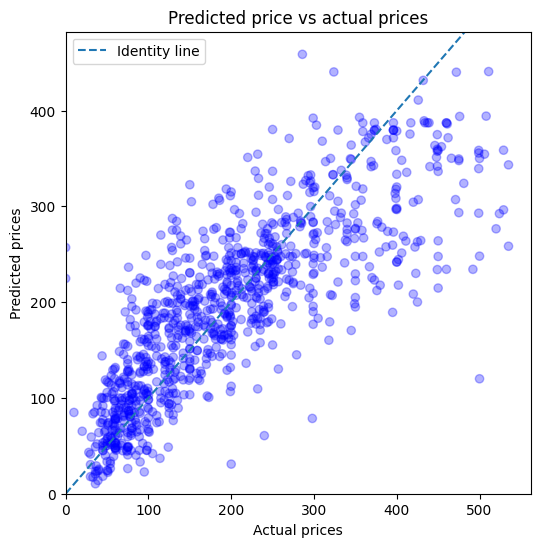

In [379]:
# Instantiate and fit the linear model
ridge_model = Ridge(alpha=10)
ridge_model = train_test_model(ridge_model, X_train, y_train, X_test, y_test)

-  Our base model (ridge) achieves on the test set:
    - R² of 0.65 ==> 65% of the price variance is explained by the model
    - RMSE error of 69 USD

- Let's try XGBoost
- Note that linearforest with ridge estimator achieved performance just slightly lower than XGBoost

RMSE on TEST set:  61.92

The r-squared score for the model on test set is 0.72 on 985 values.


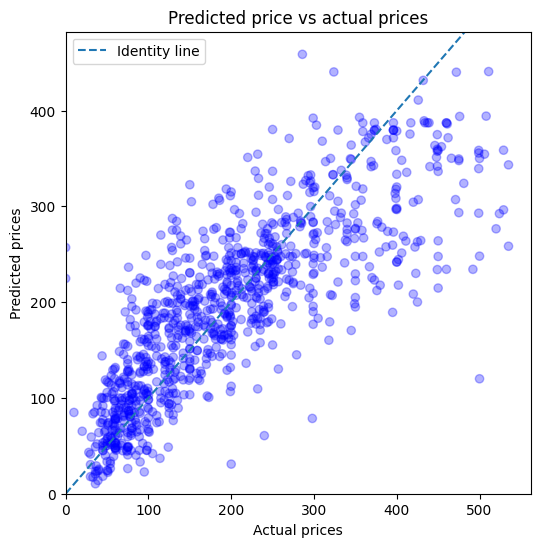

In [380]:
from xgboost import XGBRegressor
xgb = XGBRegressor(n_estimators = 50, n_jobs=-1, random_state=10  )
xgb = train_test_model(xgb, X_train, y_train, X_test, y_test)

- XGBoost improves RMSE error by circa 11%, leading to a significant increase of R² coefficient
    - R² of 0.72 ==> 72% of the price variance is explained by the model
    - RMSE of 62 USD

# Q6: Can the property text description from the host improve the prediction ?
- Using NLP technique, we will enrich the predictors by analysing the `description` provided by the host
- This text information describes the property and should provide adiditional input to justify the rental price
- We will use a bag-in-words approach to build word vectors for each property based on its description

- REMINDER: We need to handle the 1% missing `description` - We will impute using `name` shorter description

In [381]:
def impute_missing_description(row):
    """fill missing descriptions with name text"""
    if pd.isnull(row['description']):
        row['description'] = row['name']
    return row

listings_short = listings_short.apply(impute_missing_description, axis=1)

In [334]:
# Sample description field
listings_short['description'].values[:3]

array(['The "Studio at 14 Weldon" is located in Newton... feels like a million miles from the city, but  a quick 10-minute trek to Back Bay and all of Boston. Cozy villages of Newton nearby this classic British Tudor-style home. Free, secure, off-street parking. 8-minute walk to MBTA Rail, or Express Bus to Back Bay and Downtown:   Fully appointed kitchen, bath,  laundry and  very comfy  living space with cable TV and  free WiFi.  Hot tub and deck available for small fee.<br /><br /><b>The space</b><br />Warm and friendly space. Separate entrance and very private studio in private Tudor-style home on quiet Newton cul-du-sac. Designer space, warm wooden floors, full kitchen, private entrance and full bath. 800 sf Free on-site parking.  Not able to accommodate pets, sorry! 2min MassPike Exit 17. 3min Boston College Law School. 7 min walk to MBTA Commuter Rail/Newtonville Station.<br /><br /><b>Guest access</b><br />Kitchen, bathroom, Wifi, laudry room and cable access all for free. Hot t

- Let's clean the `description` field using our pre-prorcessing cleaning function

In [382]:
# Preprocessing text with cleaning step
listings_short['description'] = listings_short['description'].apply(lambda x: preprocess_text(x, set(stopwords.words("english"))))

- Let's add the description to our previous toy dataset

In [383]:
subset_df = pd.concat([listings_short.loc[:,'description'], subset_df], axis=1)
print(f'We now have a dataset of shape {subset_df.shape}')

We now have a dataset of shape (5185, 1136)


In [384]:
subset_df.head(2)

,description,property_type,room_type,accommodates,bedrooms,beds,neighbourhood_cleansed,latitude,longitude,bathrooms_text,...,6 burner professional stainless steel stove,"50"" TV with Netflix",Game console: Nintendo Wii,DOVE Usually body soap,"50"" HDTV with",Sonos sound system with Bluetooth and aux,walk-in closet,Clothing storage: wardrobe,conditioner and body wash/soap (irish spring) are stocked for guests in bathroom shower and wall cabinet body soap,Shower gel
0,studio weldon located newton feels like millio...,Private room,Private room,2,2.0,1.0,Brighton,42.35148,-71.19319,1 shared bath,...,0,0,0,0,0,0,0,0,0,0
1,fully separate apartment two apartment buildin...,Entire rental unit,Entire home/apt,2,1.0,1.0,East Boston,42.36413,-71.02991,1 bath,...,0,0,0,0,0,0,0,0,0,0


- We need the train portion of the `description` feature

In [385]:
cat_column_idx = np.where(subset_df.dtypes == object)[0]
cat_features = subset_df.columns[cat_column_idx].tolist()
cat_features

['description',
 'property_type',
 'room_type',
 'neighbourhood_cleansed',
 'bathrooms_text']

In [386]:
# We exclude the `description` from the categorical variables
X_train, X_test, y_train, y_test = data_segregation(subset_df, 'price', cat_features[1:], drop_outlier=True)

X shape before one-hot encoding (4921, 1135)
X shape after one-hot encoding (4921, 1223)


- We will now build the word vectors

In [387]:
# instantiate a vectorizer - A word must appear at least 3 times to be retained in the vocabulary
vectorizer = CountVectorizer(min_df=3)
# Train on the train portion
training_corpus = X_train.description.values
vectorizer.fit(training_corpus)
print(f'Total number of distinct words extracted from the corpus = {len(vectorizer.vocabulary_)}. These will form our features')

Total number of distinct words extracted from the corpus = 4619. These will form our features


In [388]:
# We must eliminate all the price outliers to align with our toy dataset
full_df = drop_outliers(subset_df, 'price')
# dimensionality check
assert len(full_df) == len(X_train) + len(X_test)

In [389]:
# Get the matrix of occurrences for the full dataset (column vectors per word in the vocabulary)
full_corpus = full_df.description.values
word_features = vectorizer.transform(full_corpus)
print(f'word occurence matrix of shape {word_features.shape}')
words = vectorizer.get_feature_names_out()

word occurence matrix of shape (4921, 4619)


- We now combine the toy dataset with the additional features (one column vector for each word extracted from the train set)

In [390]:
combined_df = pd.concat([full_df, pd.DataFrame(columns=[w+'_' for w in words], data=word_features.todense(), index=full_df.index)], axis=1)
# we drop the description field we have now encoded
combined_df = combined_df.drop('description', axis=1)
combined_df

,property_type,room_type,accommodates,bedrooms,beds,neighbourhood_cleansed,latitude,longitude,bathrooms_text,price,...,youtube_,youve_,yrs_,zen_,zeus_,zip_,zipcar_,zipcars_,zone_,zoo_
0,Private room,Private room,2,2.0,1.0,Brighton,42.351480,-71.193190,1 shared bath,99.0,...,0,0,0,0,0,0,0,0,0,0
1,Entire rental unit,Entire home/apt,2,1.0,1.0,East Boston,42.364130,-71.029910,1 bath,132.0,...,0,0,0,0,0,0,0,0,0,0
2,Entire guest suite,Entire home/apt,2,1.0,1.0,Roxbury,42.328440,-71.095810,1 bath,149.0,...,0,0,0,0,0,0,0,0,0,0
3,Entire condo,Entire home/apt,4,2.0,2.0,Roxbury,42.328020,-71.093870,1 bath,179.0,...,0,0,0,0,0,0,0,0,0,0
4,Private room in condo,Private room,1,1.0,1.0,Charlestown,42.390310,-71.093610,1.5 shared baths,116.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.331485,-71.051420,1 bath,51.0,...,0,0,0,0,0,0,0,0,0,0
5181,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.332679,-71.053346,1 bath,51.0,...,0,0,0,0,0,0,0,0,0,0
5182,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.333266,-71.051323,1 bath,51.0,...,0,0,0,0,0,0,0,0,0,0
5183,Private room in rental unit,Private room,2,1.0,1.0,Brighton,42.353218,-71.162178,1 bath,51.0,...,0,0,0,0,0,0,0,0,0,0


In [391]:
print(f'We now have a dataset of shape {combined_df.shape}')

We now have a dataset of shape (4921, 5754)


### Train using enriched dataset

In [392]:
cat_column_idx = np.where(combined_df.dtypes == object)[0]
cat_features = combined_df.columns[cat_column_idx].tolist()
cat_features

['property_type', 'room_type', 'neighbourhood_cleansed', 'bathrooms_text']

In [393]:
# price outliers have already been removed
X_train, X_test, y_train, y_test = data_segregation(combined_df, 'price', cat_features, drop_outlier=False)

X shape before one-hot encoding (4921, 5753)
X shape after one-hot encoding (4921, 5841)


- Let's train XGBoost and check performance if we can improve performance

RMSE on TEST set:  59.61

The r-squared score for the model on test set is 0.74 on 985 values.


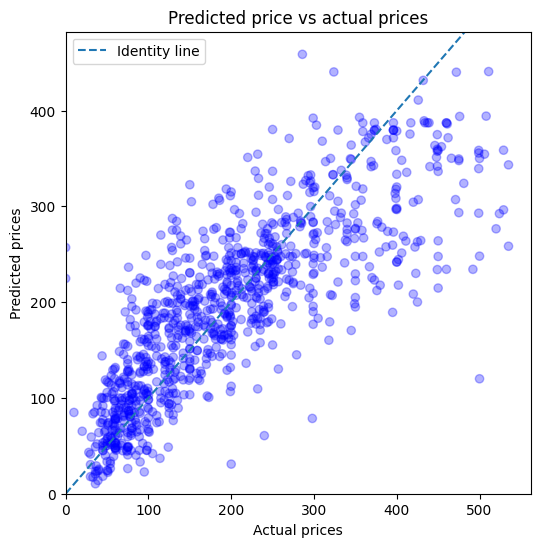

In [394]:
xgb = XGBRegressor(n_estimators = 50, n_jobs=-1, random_state=10)
xgb = train_test_model(xgb, X_train, y_train, X_test, y_test)

- We see a small reduction in RMSE error
- Let's see if we can get better results with optimized hyperparameters

In [ ]:
%%time
xgb_optim = GridSearchCV( XGBRegressor(random_state=10) ,  
                            param_grid={
                                        'n_estimators': [200, 250, 300],
                                        'max_depth': [4, 6, 8],
                                        'lambda':[30, 40]
                                        }, cv=3, n_jobs=10,
                        )

xgb_optim = train_test_model(xgb_optim, X_train, y_train, X_test, y_test)
print('BEST PARAMS: ', xgb_optim.best_params_)
make_noise()

RMSE on TEST set:  59.02

The r-squared score for the model on test set is 0.75 on 985 values.


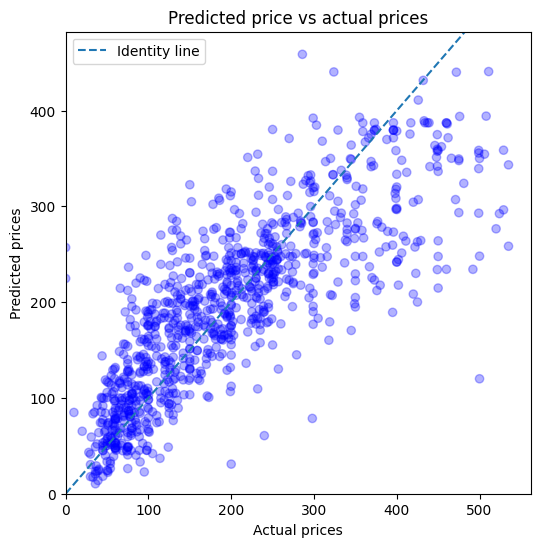

CPU times: total: 6min 36s
Wall time: 38.1 s


In [405]:
%%time
xgb = XGBRegressor(reg_lambda=50, max_depth=6, n_estimators=200, n_jobs=-1, random_state=10)
xgb = train_test_model(xgb, X_train, y_train, X_test, y_test)
make_noise()

### Conclusion Q6: 
We get an additional 5% improvement on RMSE error using NLP and property text description:
- R² = 0.75
- RMSE = 59 USD

In [406]:
# Let's observe our prediction error
yhat = xgb.predict(X_test)
errors = y_test - yhat

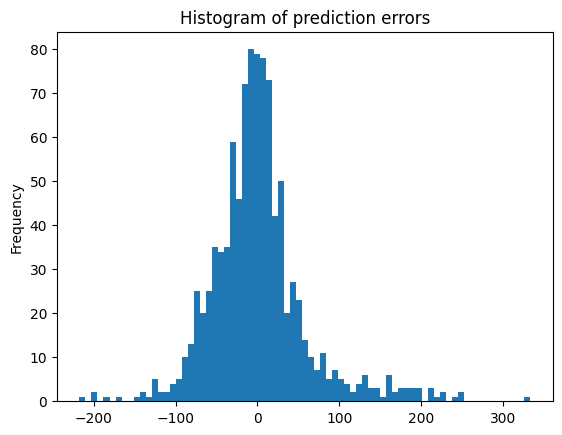

In [407]:
errors.plot(kind='hist', bins=75, title='Histogram of prediction errors')
plt.show()


### Final word
Our prediction error distribution is nicely in the form of a gaussian. This means the error is equally over or below the ground thruth.

Overall, compared to our initial base model, we have reduced RMSE by 15% down to 59 USD
- R² coefficient has improved by 0.1 as our model now explains 75% of the price variance
- Note: Including average rating and reviews metrics allows to further improve RMSE to 58.30 and to achieve R² of 0.75 (see other notebook for details)

### Next steps
- Use a simple fully-connected neural network (two to three dense layers) to check if we can further improve the regression
- I deliberately left aside features available in the listings dataset. It could be interesting to see if we can further improve the model using those
- predict price seasonality: I could test to predict weekly / daily prices based on the calendar information which I have not used
